# Machine Learning Final Project: Job Description- Resume Matching                   

by: Majdal Hindi
            

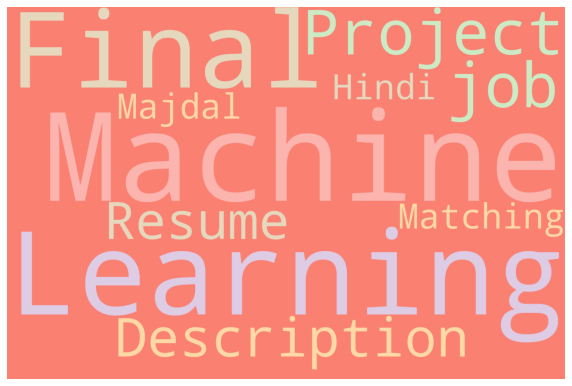

In [ ]:
from wordcloud import WordCloud
# Define a function to plot word cloud
def plot_cloud(wordcloud):
    # Set figure size
    plt.figure(figsize=(10, 10))
    # Display image
    plt.imshow(wordcloud) 
    # No axis details
    plt.axis("off");

# Generate word cloud
text=['Machine Learning Final Project job Description Resume Matching  Majdal Hindi ']
text="".join(str(elem) for elem in text)
wordcloud = WordCloud(width= 3000, height = 2000, random_state=1, background_color='salmon', colormap='Pastel1', collocations=False).generate(text)
# Plot
plot_cloud(wordcloud)

# Motivation of the project:

The biggest issue facing the companies today is how to match the best candidates with job postings by using minimum resources, and in a short amount of time. There are two major challenges:

    1. Separating the right candidates from the pack.
    2. Knowing that candidates can do the job before you hire them.

# Project Objectives:

    1. Finding the best short list of candidates to interview by matching their resumes with the job descriptions.
    2. Using NLP Techniques to build Applicant Tracking Systems that could help to make the recruitment process  more    cost-effective.
    3. ATS prevents filtering out resumes and bias, it ensures that the recruiters can make informed decisions based on subjective data.

# Load Libraries

In [ ]:
import numpy as np 
import pandas as pd 
import statsmodels

import seaborn as sns
import matplotlib.pyplot as plt
from matplotlib.gridspec import GridSpec
%matplotlib inline


from sklearn.manifold import TSNE
from sklearn.decomposition import PCA
from sklearn.feature_extraction.text import CountVectorizer
from sklearn.metrics.pairwise import cosine_similarity 
from sklearn.feature_extraction.text import TfidfVectorizer
from sklearn.feature_extraction.text import TfidfTransformer
from sklearn.preprocessing import Normalizer
from sklearn.pipeline import Pipeline
from sklearn.decomposition import LatentDirichletAllocation




import os 
os.environ["KMP_DUPLICATE_LIB_OK"]="TRUE"


import warnings
warnings.filterwarnings("ignore")

import re
import string

import gensim
from gensim.corpora import Dictionary
from gensim.models import LdaModel
from gensim.matutils import cossim
from gensim.summarization import keywords
from gensim.models.doc2vec import TaggedDocument
from gensim.models.doc2vec import Doc2Vec
from gensim.models import CoherenceModel

import nltk 
from nltk.corpus import stopwords
from  nltk.stem import SnowballStemmer
stop_words = stopwords.words("english")
stemmer = SnowballStemmer("english")
from nltk.tokenize import word_tokenize

# Resume Dataset Exploration

In [ ]:
from pandas import option_context
r_df=pd.read_csv("Resume.csv")
with option_context('display.max_colwidth', 400):
     display(r_df.head(5))

,Category,Resume
0,Data Science,"Skills * Programming Languages: Python (pandas, numpy, scipy, scikit-learn, matplotlib), Sql, Java, JavaScript/JQuery. * Machine learning: Regression, SVM, NaÃ¯ve Bayes, KNN, Random Forest, Decision Trees, Boosting techniques, Cluster Analysis, Word Embedding, Sentiment Analysis, Natural Language processing, Dimensionality reduction, Topic Modelling (LDA, NMF), PCA & Neural Nets. * Database Vi..."
1,Data Science,Education Details \r\nMay 2013 to May 2017 B.E UIT-RGPV\r\nData Scientist \r\n\r\nData Scientist - Matelabs\r\nSkill Details \r\nPython- Exprience - Less than 1 year months\r\nStatsmodels- Exprience - 12 months\r\nAWS- Exprience - Less than 1 year months\r\nMachine learning- Exprience - Less than 1 year months\r\nSklearn- Exprience - Less than 1 year months\r\nScipy- Exprience - Less than 1 ...
2,Data Science,"Areas of Interest Deep Learning, Control System Design, Programming in-Python, Electric Machinery, Web Development, Analytics Technical Activities q Hindustan Aeronautics Limited, Bangalore - For 4 weeks under the guidance of Mr. Satish, Senior Engineer in the hangar of Mirage 2000 fighter aircraft Technical Skills Programming Matlab, Python and Java, LabView, Python WebFrameWork-Django, Flask..."
3,Data Science,Skills â¢ R â¢ Python â¢ SAP HANA â¢ Tableau â¢ SAP HANA SQL â¢ SAP HANA PAL â¢ MS SQL â¢ SAP Lumira â¢ C# â¢ Linear Programming â¢ Data Modelling â¢ Advance Analytics â¢ SCM Analytics â¢ Retail Analytics â¢Social Media Analytics â¢ NLP Education Details \r\nJanuary 2017 to January 2018 PGDM Business Analytics Great Lakes Institute of Management & Illinois Institute of Technol...
4,Data Science,"Education Details \r\n MCA YMCAUST, Faridabad, Haryana\r\nData Science internship \r\n\r\n\r\nSkill Details \r\nData Structure- Exprience - Less than 1 year months\r\nC- Exprience - Less than 1 year months\r\nData Analysis- Exprience - Less than 1 year months\r\nPython- Exprience - Less than 1 year months\r\nCore Java- Exprience - Less than 1 year months\r\nDatabase Management- Exprience -..."


In [ ]:
#There is no null values 
r_df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 962 entries, 0 to 961
Data columns (total 2 columns):
 #   Column    Non-Null Count  Dtype 
---  ------    --------------  ----- 
 0   Category  962 non-null    object
 1   Resume    962 non-null    object
dtypes: object(2)
memory usage: 15.2+ KB


In [ ]:
#Add index to each Resume
r_df = r_df.reset_index()
r_df.head()

,index,Category,Resume
0,0,Data Science,Skills * Programming Languages: Python (pandas...
1,1,Data Science,Education Details \r\nMay 2013 to May 2017 B.E...
2,2,Data Science,"Areas of Interest Deep Learning, Control Syste..."
3,3,Data Science,Skills â¢ R â¢ Python â¢ SAP HANA â¢ Table...
4,4,Data Science,"Education Details \r\n MCA YMCAUST, Faridab..."


In [ ]:
#rename the index column to "Application_ID"
r_df.rename(columns = {'index':'Applicantion_ID'}, inplace = True)
with option_context('display.max_colwidth', 100):
     display(r_df.head(5))

,Applicantion_ID,Category,Resume
0,0,Data Science,"Skills * Programming Languages: Python (pandas, numpy, scipy, scikit-learn, matplotlib), Sql, Ja..."
1,1,Data Science,Education Details \r\nMay 2013 to May 2017 B.E UIT-RGPV\r\nData Scientist \r\n\r\nData Scienti...
2,2,Data Science,"Areas of Interest Deep Learning, Control System Design, Programming in-Python, Electric Machiner..."
3,3,Data Science,Skills â¢ R â¢ Python â¢ SAP HANA â¢ Tableau â¢ SAP HANA SQL â¢ SAP HANA PAL â¢ MS SQL â...
4,4,Data Science,"Education Details \r\n MCA YMCAUST, Faridabad, Haryana\r\nData Science internship \r\n\r\n\r..."


In [ ]:
#display the categories of resumes:

print("Number of the distinct categories:",len(r_df['Category'].value_counts()),"\n")
print(r_df['Category'].unique())

Number of the distinct categories: 25 

['Data Science' 'HR' 'Advocate' 'Arts' 'Web Designing'
 'Mechanical Engineer' 'Sales' 'Health and fitness' 'Civil Engineer'
 'Java Developer' 'Business Analyst' 'SAP Developer' 'Automation Testing'
 'Electrical Engineering' 'Operations Manager' 'Python Developer'
 'DevOps Engineer' 'Network Security Engineer' 'PMO' 'Database' 'Hadoop'
 'ETL Developer' 'DotNet Developer' 'Blockchain' 'Testing']


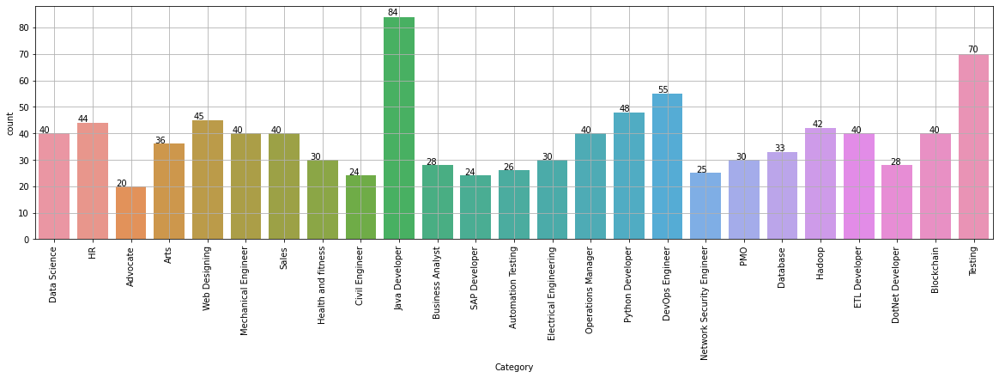

In [ ]:
#plot the number of resumes in each category. We can notice that the majority of the resumes belong to data fields

plt.figure(figsize=(20,5))
plt.xticks(rotation=90)
ax=sns.countplot(x="Category", data=r_df)
for p in ax.patches:
    ax.annotate(str(p.get_height()), (p.get_x() * 1.01 , p.get_height() * 1.01))
plt.grid()

# Extract Some Data Science Skills from the Resumes

In [ ]:
# Function to return the required skill 
def skill_req(x):
    
    if re.search(' R ', x):
        
        if re.search('python', x.lower()):
            return 'R and Python'

        else:
            return 'R only'
        
    elif re.search('python', x.lower()):
        
            return 'Python only'
        
    elif re.search('hadoop', x.lower()): 
            
            return 'Hadoop'
        
    elif re.search('sql', x.lower()): 
            
            return 'SQL'
    elif re.search('excel', x.lower()): 
            
            return 'Excel'
        
    elif re.search('java', x.lower()): 
            
            return 'Java'
    elif re.search ('sap',x.lower()):
        
            return 'SAP'

    else:
        return 'others'      

(array([0, 1, 2, 3, 4, 5, 6, 7, 8]),
 [Text(0, 0, 'Excel'),
  Text(1, 0, 'Hadoop'),
  Text(2, 0, 'Java'),
  Text(3, 0, 'Python only'),
  Text(4, 0, 'R and Python'),
  Text(5, 0, 'R only'),
  Text(6, 0, 'SAP'),
  Text(7, 0, 'SQL'),
  Text(8, 0, 'others')])

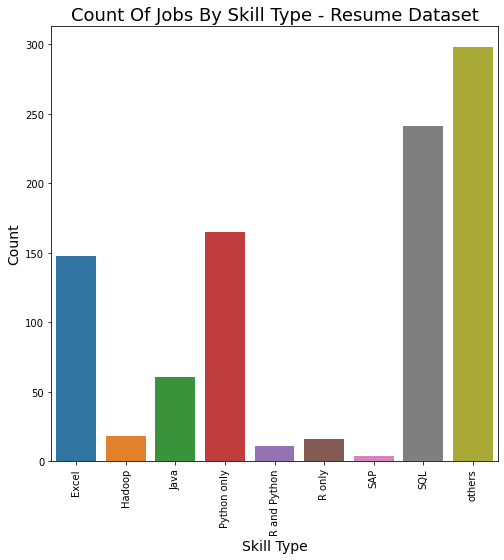

In [ ]:
r_df['Skills'] = r_df['Resume'].apply(skill_req)

prog_df = r_df.groupby('Skills').count().reset_index()[['Skills', 'Category']]

f, ax = plt.subplots(figsize=(8,8))

sns.barplot(x='Skills', y='Category', data=prog_df)

ax.set_title('Count Of Jobs By Skill Type - Resume Dataset', fontsize=18)
ax.set_xlabel('Skill Type', fontsize=14)
ax.set_ylabel('Count', fontsize=14)
plt.xticks(rotation="vertical")

#  Preprocessing Function

In [ ]:
# TEXT CLENAING
TEXT_CLEANING_RE = "@\S+|https?:\S+|http?:\S|[^A-Za-z0-9]+"

def preprocess(text, stem=False):
    # Remove link,user and special characters,stop words
    text = re.sub(TEXT_CLEANING_RE, ' ', str(text).lower()).strip()
    tokens = []
    for token in text.split():
        if token not in stop_words:
            if stem:
                tokens.append(stemmer.stem(token))
            else:
                tokens.append(token)
    return " ".join(tokens)

# Preprocessing  Resumes

In [ ]:
r_df['Cleaned_Resume'] = r_df.Resume.apply(lambda x: preprocess(x))

In [ ]:
r_df=r_df[['Applicantion_ID','Category','Resume','Cleaned_Resume']]
with option_context('display.max_colwidth', 100):
     display(r_df.head(5))

,Applicantion_ID,Category,Resume,Cleaned_Resume
0,0,Data Science,"Skills * Programming Languages: Python (pandas, numpy, scipy, scikit-learn, matplotlib), Sql, Ja...",skills programming languages python pandas numpy scipy scikit learn matplotlib sql java javascri...
1,1,Data Science,Education Details \r\nMay 2013 to May 2017 B.E UIT-RGPV\r\nData Scientist \r\n\r\nData Scienti...,education details may 2013 may 2017 b e uit rgpv data scientist data scientist matelabs skill de...
2,2,Data Science,"Areas of Interest Deep Learning, Control System Design, Programming in-Python, Electric Machiner...",areas interest deep learning control system design programming python electric machinery web dev...
3,3,Data Science,Skills â¢ R â¢ Python â¢ SAP HANA â¢ Tableau â¢ SAP HANA SQL â¢ SAP HANA PAL â¢ MS SQL â...,skills r python sap hana tableau sap hana sql sap hana pal ms sql sap lumira c linear programmin...
4,4,Data Science,"Education Details \r\n MCA YMCAUST, Faridabad, Haryana\r\nData Science internship \r\n\r\n\r...",education details mca ymcaust faridabad haryana data science internship skill details data struc...


In [ ]:
#before preprocessing:
r_df.loc[1, 'Resume']

'Education Details \r\nMay 2013 to May 2017 B.E   UIT-RGPV\r\nData Scientist \r\n\r\nData Scientist - Matelabs\r\nSkill Details \r\nPython- Exprience - Less than 1 year months\r\nStatsmodels- Exprience - 12 months\r\nAWS- Exprience - Less than 1 year months\r\nMachine learning- Exprience - Less than 1 year months\r\nSklearn- Exprience - Less than 1 year months\r\nScipy- Exprience - Less than 1 year months\r\nKeras- Exprience - Less than 1 year monthsCompany Details \r\ncompany - Matelabs\r\ndescription - ML Platform for business professionals, dummies and enthusiasts.\r\n60/A Koramangala 5th block,\r\nAchievements/Tasks behind sukh sagar, Bengaluru,\r\nIndia                               Developed and deployed auto preprocessing steps of machine learning mainly missing value\r\ntreatment, outlier detection, encoding, scaling, feature selection and dimensionality reduction.\r\nDeployed automated classification and regression model.\r\nlinkedin.com/in/aditya-rathore-\r\nb4600b146        

In [ ]:
#After preprocessing:
r_df.loc[1, 'Cleaned_Resume']

'education details may 2013 may 2017 b e uit rgpv data scientist data scientist matelabs skill details python exprience less 1 year months statsmodels exprience 12 months aws exprience less 1 year months machine learning exprience less 1 year months sklearn exprience less 1 year months scipy exprience less 1 year months keras exprience less 1 year monthscompany details company matelabs description ml platform business professionals dummies enthusiasts 60 koramangala 5th block achievements tasks behind sukh sagar bengaluru india developed deployed auto preprocessing steps machine learning mainly missing value treatment outlier detection encoding scaling feature selection dimensionality reduction deployed automated classification regression model linkedin com aditya rathore b4600b146 reasearch deployed time series forecasting model arima sarimax holt winter prophet worked meta feature extracting problem github com rathorology implemented state art research paper outlier detection mixed a

# Most Common Words in Cleaned_Resumes

In [ ]:
oneSetOfStopWords = set(stopwords.words('english')+['``',"''"])
totalWords =[]
Sentences = r_df['Resume'].values
cleanedSentences = ""
for i in range(0,962):
    cleanedText = preprocess(Sentences[i])
    cleanedSentences += cleanedText
    requiredWords = nltk.word_tokenize(cleanedText)
    for word in requiredWords:
        if word not in oneSetOfStopWords and word not in string.punctuation:
            totalWords.append(word)
    
wordfreqdist = nltk.FreqDist(totalWords)
mostcommon = wordfreqdist.most_common(50)
print(mostcommon)

[('exprience', 3829), ('company', 3578), ('project', 3498), ('months', 3288), ('description', 3122), ('details', 3096), ('1', 2162), ('data', 2156), ('management', 1999), ('team', 1950), ('6', 1499), ('maharashtra', 1449), ('system', 1425), ('testing', 1349), ('year', 1336), ('database', 1280), ('development', 1203), ('business', 1196), ('ltd', 1177), ('test', 1174), ('less', 1145), ('using', 1124), ('sql', 1120), ('skill', 1117), ('january', 1090), ('client', 1085), ('java', 1076), ('developer', 1069), ('engineering', 1055), ('application', 1046), ('pune', 1026), ('work', 987), ('services', 956), ('skills', 950), ('c', 910), ('software', 887), ('pvt', 879), ('education', 857), ('responsibilities', 856), ('sales', 825), ('reports', 814), ('process', 813), ('operations', 791), ('requirements', 790), ('2', 776), ('customer', 775), ('server', 773), ('technical', 767), ('technologies', 764), ('india', 762)]


In [ ]:
from nltk.tokenize import word_tokenize
# define a function for parts of speech tagging
# make a corpus of all the words in the job description
corpus = " ".join(r_df['Cleaned_Resume'].tolist())

# This is the NLTK function that breaks a string down to its tokens
tokens = word_tokenize(corpus)

# Get the parts of speech tag for all words
answer = nltk.pos_tag(tokens)
answer_pos = [a[1] for a in answer]

# print a value count for the parts of speech
all_pos = pd.Series(answer_pos)
all_pos.value_counts().head(10)

NN     140799
NNS     47617
JJ      45825
VBG     20493
CD      15443
VBP     14109
VBD      7332
RB       6869
VBN      5674
VBZ      4350
dtype: int64

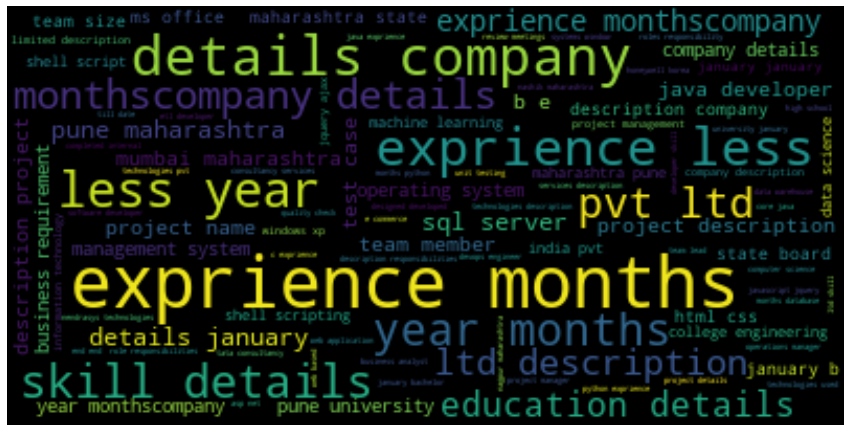

In [ ]:
from wordcloud import WordCloud
wc = WordCloud().generate(cleanedSentences)
plt.figure(figsize=(15,15))
plt.imshow(wc, interpolation='bilinear')
plt.axis("off")
plt.show()

# Jobs Dataset Exploration

In [ ]:
j_df=pd.read_csv("Jobs.csv",encoding = 'ISO-8859-1')
j_df.head()

,Role,Company,Location,Contract,Salary,Job_description
0,Data Science Consultant - Associate - Artifici...,PwC,London,NaN,NaN,Background PwC are a trusted adviser to some o...
1,Data Science Manager,Isharat,London NW1,NaN,NaN,We are looking for a Data Science Manager who ...
2,Fraud Analytics Manager,Harnham,London,Permanent,"£50,000 - £70,000 a year",FRAUD ANALYTICS MANAGERLONDON - CURRENTLY FLEX...
3,CIB Applied AI & Machine Learning  Economic a...,JP Morgan Chase,London E14,NaN,NaN,CIB Applied AI & Machine Learning  Economic a...
4,"Consultant, Data Scientist, Ventures, Tax, London",Deloitte,London,NaN,NaN,Your opportunity Our Tax Ventures team is expa...


In [ ]:
#Add index to each Role
j_df = j_df.reset_index()
j_df.head()

,index,Role,Company,Location,Contract,Salary,Job_description
0,0,Data Science Consultant - Associate - Artifici...,PwC,London,NaN,NaN,Background PwC are a trusted adviser to some o...
1,1,Data Science Manager,Isharat,London NW1,NaN,NaN,We are looking for a Data Science Manager who ...
2,2,Fraud Analytics Manager,Harnham,London,Permanent,"£50,000 - £70,000 a year",FRAUD ANALYTICS MANAGERLONDON - CURRENTLY FLEX...
3,3,CIB Applied AI & Machine Learning  Economic a...,JP Morgan Chase,London E14,NaN,NaN,CIB Applied AI & Machine Learning  Economic a...
4,4,"Consultant, Data Scientist, Ventures, Tax, London",Deloitte,London,NaN,NaN,Your opportunity Our Tax Ventures team is expa...


In [ ]:
#Rename the index column to "Job_ID"
j_df.rename(columns = {'index':'Job_ID'}, inplace = True)
j_df.head()

,Job_ID,Role,Company,Location,Contract,Salary,Job_description
0,0,Data Science Consultant - Associate - Artifici...,PwC,London,NaN,NaN,Background PwC are a trusted adviser to some o...
1,1,Data Science Manager,Isharat,London NW1,NaN,NaN,We are looking for a Data Science Manager who ...
2,2,Fraud Analytics Manager,Harnham,London,Permanent,"£50,000 - £70,000 a year",FRAUD ANALYTICS MANAGERLONDON - CURRENTLY FLEX...
3,3,CIB Applied AI & Machine Learning  Economic a...,JP Morgan Chase,London E14,NaN,NaN,CIB Applied AI & Machine Learning  Economic a...
4,4,"Consultant, Data Scientist, Ventures, Tax, London",Deloitte,London,NaN,NaN,Your opportunity Our Tax Ventures team is expa...


In [ ]:
j_df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 652 entries, 0 to 651
Data columns (total 7 columns):
 #   Column           Non-Null Count  Dtype 
---  ------           --------------  ----- 
 0   Job_ID           652 non-null    int64 
 1   Role             652 non-null    object
 2   Company          652 non-null    object
 3   Location         652 non-null    object
 4   Contract         257 non-null    object
 5   Salary           250 non-null    object
 6   Job_description  652 non-null    object
dtypes: int64(1), object(6)
memory usage: 35.8+ KB


In [ ]:
print("The number of the distinct roles is",len(j_df['Role'].unique()),"posted by",len(j_df["Location"].unique()),"Companies","at",len(j_df['Location'].unique()),"Locations in London","\nThe number of (Job_description) documents is",j_df.shape[0], "consist of", j_df['Job_description'].apply(lambda x: len(x.split())).sum(),'words')

The number of the distinct roles is 455 posted by 58 Companies at 58 Locations in London 
The number of (Job_description) documents is 652 consist of 292437 words


In [ ]:
print ("Displaying the distinct roles  and the number of records belonging to each company:\n\n")
print (j_df['Company'].value_counts())

Displaying the distinct roles  and the number of records belonging to each company:


Harnham                            61
Datatech Analytics                 25
IQVIA                              18
Metrica Recruitment                17
GCS Recruitment Specialists Ltd    15
                                   ..
First Port                          1
Proactive.IT Appointments           1
Adaptavist                          1
Cloudflare                          1
Unilever                            1
Name: Company, Length: 296, dtype: int64


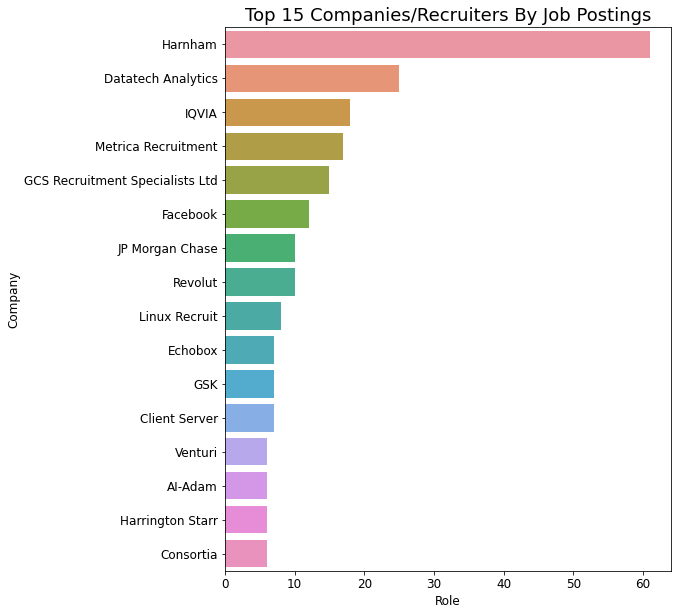

In [ ]:
import matplotlib.pyplot as plt

SMALL_SIZE = 12
MEDIUM_SIZE = 14
BIGGER_SIZE = 16

plt.rc('font', size=SMALL_SIZE)          # controls default text sizes
plt.rc('xtick', labelsize=SMALL_SIZE)    # fontsize of the tick labels
plt.rc('ytick', labelsize=SMALL_SIZE)    # fontsize of the tick labels
plt.rc('legend', fontsize=SMALL_SIZE)    # legend fon

# Initialize the matplotlib figure
f, ax = plt.subplots(figsize=(8, 10))

#Dataset relating to recruiters
rec_df = j_df.groupby('Company').count().sort_values(by='Role', ascending=False).reset_index()[['Company', 'Role']].copy()

# Plot the total crashes
sns.set_color_codes("bright")
sns.barplot(x="Role", y="Company", data=rec_df.loc[0:15,:],
            label="Total")

plt.title('Top 15 Companies/Recruiters By Job Postings', fontsize=18);

In [ ]:
#we can notice that most of the job postings belong to Data field
j_df['Role'].unique()

array(['Data Science Consultant - Associate - Artificial Intelligence',
       'Data Science Manager', 'Fraud Analytics Manager',
       'CIB Applied AI & Machine Learning \x96 Economic and Financial Research - NLP Specialist - Associate / VP',
       'Consultant, Data Scientist, Ventures, Tax, London',
       'Commercial Analytics Manager, Digital Analytics - Assisted Relocation to Copenhagen, DK',
       'Data Scientist', 'Head of Data Science',
       'Solution Architect (Data Science & AI)',
       'Deals - Investigative Analytics - Data Scientist - London',
       'Senior Data Scientist', 'Data Scientist - NLP',
       'Deep Learning and SLAM Research Intern',
       'Analytics Consultant \x96 London', 'NLP Engineer',
       'Senior Applied Scientist - Machine Learning',
       'CIB Applied AI & Machine Learning \x96 Finance & Business Management - Associate',
       'Principal Specialist - Machine Learning & Artificial Intelligence - Global Accounts',
       'Data Analytics Appre

# Extract Some Role Type & Position from the Job Title (Role)

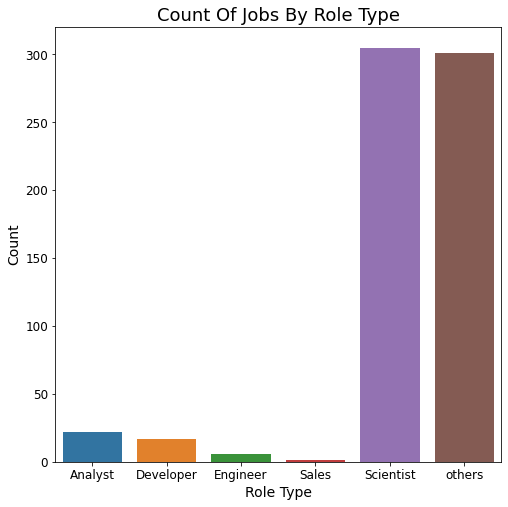

In [ ]:
# Function to return the type of role based on keywords in the title.
def role_type(x):
    if 'Analyst' in x:
        return 'Analyst'
    elif 'Scientist' in x:
        return 'Scientist'
    elif ('Engineering' or 'Engineer') in x:
        return 'Engineer'
    elif 'Sales' in x:
        return 'Sales'
    elif 'Developer' in x:
        return 'Developer'
    else:
        return 'others'
    
j_df['Role_Type'] = j_df['Role'].apply(role_type)

job_df = j_df.groupby('Role_Type').count().reset_index()[['Role_Type', 'Role']]

f, ax = plt.subplots(figsize=(8, 8))

sns.barplot(x='Role_Type', y='Role', data=job_df)

ax.set_title('Count Of Jobs By Role Type', fontsize=18)
ax.set_xlabel('Role Type', fontsize=14)
ax.set_ylabel('Count', fontsize=14);

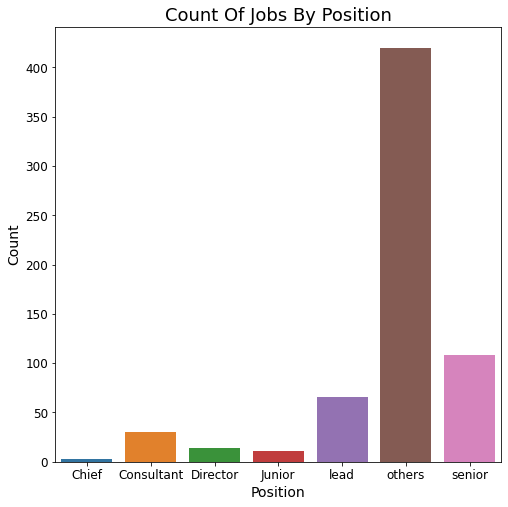

In [ ]:
# Function to return position based on keywords in the title.
def position(x):
    
    if 'Lead' in x:
        return 'lead'
    elif 'Head' in x:
        return 'lead'
    elif 'Chief' in x:
        return 'Chief'
    elif 'Senior' in x:
        return 'senior'
    elif 'graduate' in x:
        return 'graduate'
    elif 'Consultant' in x:
        return 'Consultant'
    elif 'Director' in x:
        return 'Director'
    elif "Junior" in x:
        return "Junior"   
    else:
        return 'others'
    
    
j_df['Position'] = j_df['Role'].apply(position)

job_df = j_df.groupby('Position').count().reset_index()[['Position', 'Role']]

f, ax = plt.subplots(figsize=(8, 8))

sns.barplot(x='Position', y='Role', data=job_df)

ax.set_title('Count Of Jobs By Position', fontsize=18)
ax.set_xlabel('Position', fontsize=14)
ax.set_ylabel('Count', fontsize=14);

# Extract Some Data Science Skills from Job description Postings

(array([0, 1, 2, 3, 4, 5, 6, 7]),
 [Text(0, 0, 'Excel'),
  Text(1, 0, 'Hadoop'),
  Text(2, 0, 'Python only'),
  Text(3, 0, 'R and Python'),
  Text(4, 0, 'R only'),
  Text(5, 0, 'SAP'),
  Text(6, 0, 'SQL'),
  Text(7, 0, 'others')])

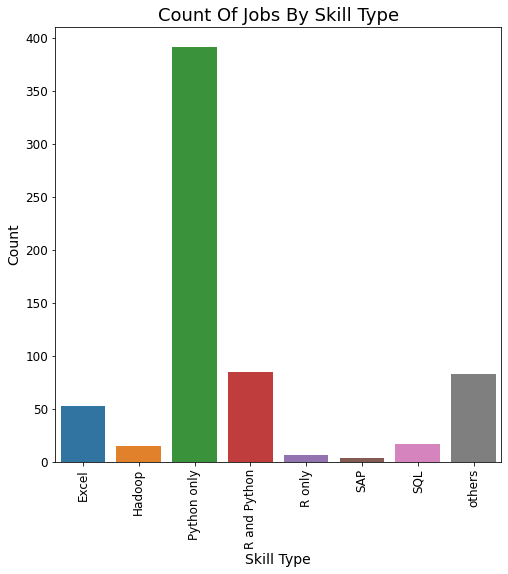

In [ ]:
#Extract skills from job description coulmn

# Function to return the required skill 

def skill_req(x):
    
    if re.search(' R ', x):
        
        if re.search('python', x.lower()):
            return 'R and Python'

        else:
            return 'R only'
        
    elif re.search('python', x.lower()):
        
            return 'Python only'
        
    elif re.search('hadoop', x.lower()): 
            
            return 'Hadoop'
        
    elif re.search('sql', x.lower()): 
            
            return 'SQL'
    elif re.search('excel', x.lower()): 
            
            return 'Excel'
        
    elif re.search('java', x.lower()): 
            
            return 'Java'
    elif re.search ('sap',x.lower()):
        
            return 'SAP'

    else:
        return 'others' 
       

j_df['Skills'] = j_df['Job_description'].apply(skill_req)

prog_df = j_df.groupby('Skills').count().reset_index()[['Skills', 'Role']]

f, ax = plt.subplots(figsize=(8,8))

sns.barplot(x='Skills', y='Role', data=prog_df)

ax.set_title('Count Of Jobs By Skill Type', fontsize=18)
ax.set_xlabel('Skill Type', fontsize=14)
ax.set_ylabel('Count', fontsize=14)
plt.xticks(rotation="vertical")

In [ ]:
#check which column has null values
j_df.isnull().sum()

Job_ID               0
Role                 0
Company              0
Location             0
Contract           395
Salary             402
Job_description      0
Role_Type            0
Position             0
Skills               0
dtype: int64

In [ ]:
##Replace missing values  for contract and salary columns
j_df = j_df.fillna('-')
j_df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 652 entries, 0 to 651
Data columns (total 10 columns):
 #   Column           Non-Null Count  Dtype 
---  ------           --------------  ----- 
 0   Job_ID           652 non-null    int64 
 1   Role             652 non-null    object
 2   Company          652 non-null    object
 3   Location         652 non-null    object
 4   Contract         652 non-null    object
 5   Salary           652 non-null    object
 6   Job_description  652 non-null    object
 7   Role_Type        652 non-null    object
 8   Position         652 non-null    object
 9   Skills           652 non-null    object
dtypes: int64(1), object(9)
memory usage: 51.1+ KB


# Preprocessing Job_desciption Postings

In [ ]:
j_df['Clean_Job_Descriptions'] = j_df.Job_description.apply(lambda x: preprocess(x))

In [ ]:
#Before preprocessing:
j_df.loc[2, 'Job_description']

'FRAUD ANALYTICS MANAGERLONDON - CURRENTLY FLEXIBLE/REMOTE/HOME WORKING UP TO £70,000 + BENEFITS + BONUS An exciting opportunity to join an industry leading team working with data and advanced analytics to develop solutions for some of the hardest fraud challenges across multiple industries. THE COMPANY A global leading professional services firm with one of the largest forensic practices. Having recently been ranked top for using sophisticated analytical and technology driven methods, this company is leading the way on developing solutions for industry fraud challenges. THE ROLE Design, implement and optimise fraud software solutions Lead multiple workstreams across Fraud Analytics and Data Science Develop business and encourage the adoption of big data technology and machine learning within clients Support junior team members with ETL processes, data mining and data analytics using SQL Deliver reporting and analytics to senior client stakeholders Respond to RFPs and Tenders, as requi

In [ ]:
#After preprocessing:
j_df.loc[2, 'Clean_Job_Descriptions']

'fraud analytics managerlondon currently flexible remote home working 70 000 benefits bonus exciting opportunity join industry leading team working data advanced analytics develop solutions hardest fraud challenges across multiple industries company global leading professional services firm one largest forensic practices recently ranked top using sophisticated analytical technology driven methods company leading way developing solutions industry fraud challenges role design implement optimise fraud software solutions lead multiple workstreams across fraud analytics data science develop business encourage adoption big data technology machine learning within clients support junior team members etl processes data mining data analytics using sql deliver reporting analytics senior client stakeholders respond rfps tenders required skills experience strong domain experience within fraud trust safety similar advanced technical skills including hands experience sql programming language python p

# Most Common Words in Clean_Job_Descriptions Postings

In [ ]:
oneSetOfStopWords = set(stopwords.words('english')+['``',"''"])
totalWords =[]
Sentences = j_df['Job_description'].values
cleanedSentences = ""
for i in range(0,652):
    cleanedText = preprocess(Sentences[i])
    cleanedSentences += cleanedText
    requiredWords = nltk.word_tokenize(cleanedText)
    for word in requiredWords:
        if word not in oneSetOfStopWords and word not in string.punctuation:
            totalWords.append(word)
    
wordfreqdist = nltk.FreqDist(totalWords)
mostcommon = wordfreqdist.most_common(50)
print(mostcommon)

[('data', 5357), ('experience', 2401), ('learning', 1836), ('team', 1783), ('science', 1557), ('work', 1475), ('business', 1432), ('machine', 1413), ('working', 1196), ('skills', 1033), ('role', 907), ('analytics', 889), ('solutions', 738), ('development', 729), ('python', 714), ('new', 693), ('scientist', 650), ('knowledge', 647), ('company', 628), ('strong', 609), ('world', 608), ('technical', 600), ('people', 576), ('models', 559), ('clients', 558), ('analysis', 555), ('research', 552), ('product', 551), ('using', 549), ('technology', 545), ('looking', 545), ('ai', 545), ('us', 533), ('help', 532), ('across', 523), ('build', 517), ('ability', 506), ('opportunity', 502), ('building', 500), ('projects', 484), ('techniques', 483), ('teams', 478), ('including', 469), ('london', 468), ('within', 462), ('engineering', 451), ('software', 451), ('tools', 441), ('problems', 427), ('leading', 419)]


In [ ]:
from nltk.tokenize import word_tokenize
# define a function for parts of speech tagging
# make a corpus of all the words in the job description
corpus = " ".join(j_df['Clean_Job_Descriptions'].tolist())

# This is the NLTK function that breaks a string down to its tokens
tokens = word_tokenize(corpus)

# Get the parts of speech tag for all words
answer = nltk.pos_tag(tokens)
answer_pos = [a[1] for a in answer]

# print a value count for the parts of speech
all_pos = pd.Series(answer_pos)
all_pos.value_counts().head(10)

NN     70675
JJ     34181
NNS    32874
VBG    14033
VBP    11389
RB      6050
CD      3340
VBD     3108
VB      3098
VBN     2933
dtype: int64

Nouns (NN), plural nouns (NNS), adjectives (JJ), Pronouns (IN) and Determiners (DT) are the top 5 parts of speech tagged in the corpus. Mostly these will be the top 5 parts of speech for any corpus!

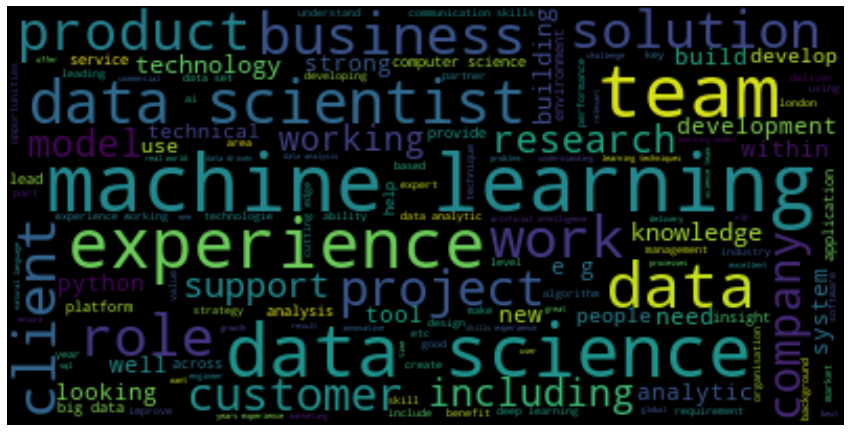

In [ ]:
wc = WordCloud().generate(cleanedSentences)
plt.figure(figsize=(15,15))
plt.imshow(wc, interpolation='bilinear')
plt.axis("off")
plt.show()

#  Models:

    * CountVectorizer
    * TF-IDF
    * LDA
    * Doc2Vec 
    * Word Embedding

# 1. CountVectorizer Model

In [ ]:
#Example: Choose randomly two docs from the two dataset:
jobdesc=j_df.loc[0, 'Clean_Job_Descriptions']
resume= r_df.loc[719, 'Cleaned_Resume']

#Build,Train 
cv=CountVectorizer(stop_words='english')
matrix=cv.fit_transform([jobdesc])

In [ ]:
matrix.todense()

matrix([[ 1,  1,  1,  2,  1,  1,  2,  5,  1,  1,  1,  1,  1,  1,  2,  1,
          1,  1,  1,  2,  1,  1,  1,  1,  1,  1,  1,  1,  1,  2,  1,  1,
          1,  2, 16,  1,  2,  1,  1,  2,  1,  5,  1,  2,  1,  1,  1,  1,
          3,  1,  1,  1,  2,  1,  1,  1,  1,  2,  1,  1,  1,  1, 14,  1,
          2,  1,  2,  3,  1,  1,  1,  1,  2,  2,  1,  1,  2,  2,  2,  1,
          1,  1,  1,  1,  1,  1,  2,  2,  1,  1,  1,  2,  1,  1,  1,  1,
          2,  1,  1,  3,  1,  1,  1,  3,  1,  1,  1,  1,  1,  1,  1,  1,
          1,  2,  1,  1,  1,  1,  2,  2,  2,  1,  1,  1,  2,  1,  1,  4,
          2,  1,  1,  1,  1,  1,  1,  3,  1,  2,  1,  3,  1,  1,  1,  1,
          3,  2,  1,  1,  1,  1,  1,  1,  1,  1,  1,  1,  2,  1,  1,  1,
          1,  2,  1,  1,  4,  1,  1,  1,  4,  1,  1,  1,  1,  1,  1,  2,
          1,  2,  1,  1,  1,  2,  1,  1,  1,  1,  7,  1,  1,  1,  1,  1,
          1,  1,  2,  1,  1,  1,  2,  1,  1,  8,  2,  2,  2,  1,  1,  3,
          2,  7,  1,  1,  2,  1,  1,  1,  1,  1,  1

In [ ]:
print(f"matrix shape: {matrix.shape}, # documents: {len(resume)}. # unique words: {len(cv.get_feature_names())}")

matrix shape: (1, 258), # documents: 1732. # unique words: 258


In [ ]:
#display vocabulary
cv.get_feature_names()

['158',
 'able',
 'academic',
 'acumen',
 'adapt',
 'adviser',
 'agile',
 'ai',
 'aim',
 'aims',
 'algorithms',
 'alongside',
 'alteryx',
 'ambition',
 'analytics',
 'applydiversity',
 'appropriate',
 'arrangements',
 'articulate',
 'artificial',
 'attract',
 'attributes',
 'audience',
 'authentic',
 'availability',
 'aws',
 'azure',
 'background',
 'backgrounds',
 'behaviours',
 'best',
 'big',
 'board',
 'build',
 'business',
 'businesses',
 'capabilities',
 'capability',
 'careers',
 'change',
 'changing',
 'clients',
 'cloud',
 'com',
 'communicate',
 'communication',
 'company',
 'compelling',
 'concepts',
 'constant',
 'consultant',
 'consultants',
 'consulting',
 'contributing',
 'core',
 'countries',
 'craft',
 'create',
 'creating',
 'culture',
 'current',
 'currently',
 'data',
 'degree',
 'deliver',
 'delivering',
 'delivery',
 'demonstrable',
 'demonstrate',
 'design',
 'desirable',
 'develop',
 'developing',
 'development',
 'different',
 'directly',
 'diverse',
 'diversit

In [ ]:
print(f"dictionary size: {len(cv.get_feature_names())}")

dictionary size: 258


In [ ]:
_,word_indices = np.nonzero(matrix) # get indeces of words present in the document. 
word_counts = np.array(matrix[0,word_indices].todense()).squeeze()
words = np.array(cv.get_feature_names())[word_indices]
sorted(zip(word_counts, words), reverse = True)

[(16, 'business'),
 (14, 'data'),
 (8, 'science'),
 (7, 'skills'),
 (7, 'pwc'),
 (6, 'understanding'),
 (6, 'strategy'),
 (5, 'clients'),
 (5, 'ai'),
 (4, 'work'),
 (4, 'team'),
 (4, 'people'),
 (4, 'organisations'),
 (4, 'intelligence'),
 (3, 'world'),
 (3, 'senior'),
 (3, 'looking'),
 (3, 'learning'),
 (3, 'leadership'),
 (3, 'financial'),
 (3, 'exposure'),
 (3, 'demonstrable'),
 (3, 'concepts'),
 (2, 'www'),
 (2, 'working'),
 (2, 'value'),
 (2, 'use'),
 (2, 'uk'),
 (2, 'technology'),
 (2, 'techniques'),
 (2, 'support'),
 (2, 'strong'),
 (2, 'solutions'),
 (2, 'services'),
 (2, 'seek'),
 (2, 'sectors'),
 (2, 'scientists'),
 (2, 'responsibilities'),
 (2, 'relationships'),
 (2, 'projects'),
 (2, 'professional'),
 (2, 'private'),
 (2, 'opportunities'),
 (2, 'need'),
 (2, 'machine'),
 (2, 'learn'),
 (2, 'internal'),
 (2, 'increasingly'),
 (2, 'impact'),
 (2, 'house'),
 (2, 'help'),
 (2, 'global'),
 (2, 'experience'),
 (2, 'essential'),
 (2, 'enhance'),
 (2, 'engineers'),
 (2, 'driven'),


In [ ]:
# convert search resume into a vector using trained model
phrases_matrix = cv.transform([resume])
phrases_matrix.todense()

matrix([[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 0, 0, 0, 0, 0, 0,
         0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 0, 0, 5, 0, 0, 0, 0, 0, 0, 3,
         0, 0, 0, 3, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 6,
         0, 0, 0, 0, 0, 0, 2, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,
         0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 2, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,
         0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,
         0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 1, 0, 0, 3, 0, 0, 0, 0, 0, 3, 0,
         0, 0, 0, 0, 0, 0, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,
         0, 0, 0, 1, 0, 0, 0, 0, 0, 0, 1, 2, 0, 1, 0, 0, 0, 0, 0, 1, 1,
         0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 2, 0, 0, 0, 0, 0, 0, 0, 5,
         0, 0, 0, 0, 0, 0, 3, 0, 0, 1, 0, 1, 0, 0, 0, 0, 0, 0, 0, 0, 3,
         0, 1, 2, 0, 0, 0, 0, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,
         0, 1, 0, 0, 0, 0]], dtype=int64)

In [ ]:
similarities = cosine_similarity(matrix,phrases_matrix).flatten()
print("Resume - Job Similarity =",similarities,"by using CountVectorizer Model")

Resume - Job Similarity = [0.62872871] by using CountVectorizer Model


# Top 10 Applications (Resume - Job Matching) Function by CountVectorizer

In [ ]:
def match_resume_with_job_description_cv(jobsfile,resumefile,job_index):
    result=[]
    r_df=pd.read_csv(resumefile)
    r_df = r_df.reset_index()
    r_df.rename(columns = {'index':'Application_ID'}, inplace = True)
    r_df['Cleaned_Resume'] = r_df.Resume.apply(lambda x: preprocess(x))
    j_df=pd.read_csv(jobsfile,encoding = 'ISO-8859-1')
    j_df = j_df.reset_index()
    j_df.rename(columns = {'index':'Job_ID'}, inplace = True)
    j_df['Clean_Job_Descriptions'] = j_df.Job_description.apply(lambda x: preprocess(x))
    
    for r in range(0,len(r_df["Application_ID"])):
        
        jobdesc=j_df['Clean_Job_Descriptions'][job_index]
        resume=r_df["Cleaned_Resume"][r]
        cv=CountVectorizer(stop_words='english')
        count_matrix=cv.fit_transform([jobdesc])
        phrases_matrix=cv.transform([resume])
        similarity = float(cosine_similarity(count_matrix,phrases_matrix).flatten())
        role=j_df['Role'][job_index]
        company= j_df["Company"][job_index]  
        category=r_df["Category"][r] 
        result.append([r,similarity,category])   
    return  result,role,company

# Results:

The best 10 applicantions of ' Data Science Consultant - Associate - Artificial Intelligence ' Role at  PwC Company:

      Applicantion_ID  Similarity      Category
719              719    0.628729      Database
730              730    0.628729      Database
741              741    0.628729      Database
9                  9    0.596647  Data Science
19                19    0.596647  Data Science
29                29    0.596647  Data Science
39                39    0.596647  Data Science
6                  6    0.575731  Data Science
16                16    0.575731  Data Science
26                26    0.575731  Data Science


Text(0.5, 1.0, 'Distribution of Resumes Similarities with respect to Data Science Consultant - Associate - Artificial Intelligence job description\n')

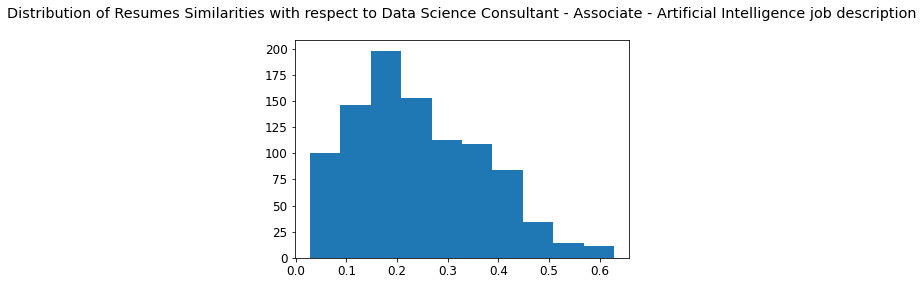

In [ ]:
result,role,company=match_resume_with_job_description_cv("Jobs.csv","Resume.csv",0)      
df=pd.DataFrame (result, columns = ['Applicantion_ID','Similarity','Category'])
match=df.nlargest(n=10, columns=['Similarity'], keep='all')
print("The best 10 applicantions of '", role,"' Role at ",company,'Company:\n\n',match.head(10))
plt.hist(list(list(zip(*result))[1]));
plt.title(f'Distribution of Resumes Similarities with respect to {role} job description\n') 

The best 10 applicantions of ' Data Engineer Machine Learning Python R ' Role at  Client Server Company:

      Applicantion_ID  Similarity      Category
7                  7    0.629085  Data Science
17                17    0.629085  Data Science
27                27    0.629085  Data Science
37                37    0.629085  Data Science
745              745    0.577757        Hadoop
752              752    0.577757        Hadoop
759              759    0.577757        Hadoop
766              766    0.577757        Hadoop
773              773    0.577757        Hadoop
780              780    0.577757        Hadoop


Text(0.5, 1.0, 'Distribution of Resumes Similarities with respect to Data Engineer Machine Learning Python R job description\n')

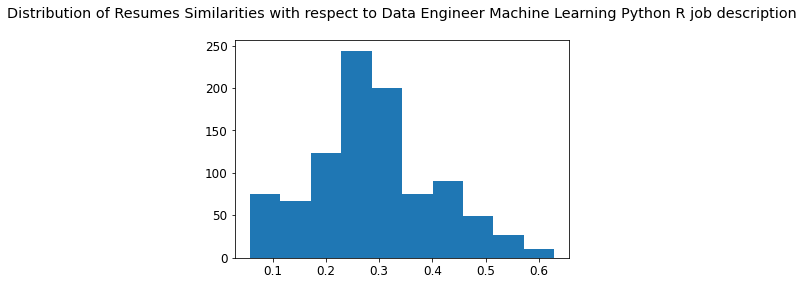

In [ ]:
result,role,company=match_resume_with_job_description_cv("Jobs.csv","Resume.csv",100)      
df=pd.DataFrame (result, columns = ['Applicantion_ID','Similarity','Category'])
match=df.nlargest(n=10, columns=['Similarity'], keep='all')
print("The best 10 applicantions of '", role,"' Role at ",company,'Company:\n\n',match.head(10))
plt.hist(list(list(zip(*result))[1]));
plt.title(f'Distribution of Resumes Similarities with respect to {role} job description\n') 

The best 10 applicantions of ' Machine Learning Engineer, Predictive Analytics ' Role at  IQVIA Company:

     Applicantion_ID  Similarity      Category
7                 7    0.538468  Data Science
17               17    0.538468  Data Science
27               27    0.538468  Data Science
37               37    0.538468  Data Science
6                 6    0.479245  Data Science
16               16    0.479245  Data Science
26               26    0.479245  Data Science
36               36    0.479245  Data Science
8                 8    0.446690  Data Science
18               18    0.446690  Data Science


Text(0.5, 1.0, 'Distribution of Resumes Similarities with respect to Machine Learning Engineer, Predictive Analytics job description\n')

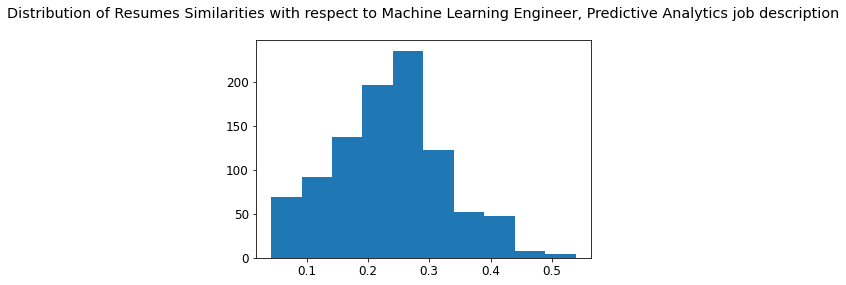

In [ ]:
result,role,company=match_resume_with_job_description_cv("Jobs.csv","Resume.csv",600)      
df=pd.DataFrame (result, columns = ['Applicantion_ID','Similarity','Category'])
match=df.nlargest(n=10, columns=['Similarity'], keep='all')
print("The best 10 applicantions of '", role,"' Role at ",company,'Company:\n\n',match.head(10))
plt.hist(list(list(zip(*result))[1]));
plt.title(f'Distribution of Resumes Similarities with respect to {role} job description\n') 

# 2. TF_IDF Vectorizer Model

In [ ]:
from sklearn.feature_extraction.text import TfidfVectorizer
#Choose randomly two docs from the two dataset:
jobdesc=j_df.loc[0, 'Clean_Job_Descriptions']
resume= r_df.loc[719, 'Cleaned_Resume']

In [ ]:
#Build The Model 
from sklearn.feature_extraction.text import CountVectorizer
from sklearn.feature_extraction.text import TfidfTransformer
from sklearn.preprocessing import Normalizer
from sklearn.pipeline import Pipeline
tf_idf_pipeline = Pipeline([
    ('vect',CountVectorizer(stop_words='english')), # compute bag of words
    ('tfidf',TfidfTransformer()), # use bag of words to compute tf-idf
    ('norm',Normalizer(norm='l2')), # normalize tf-dif vectors for every doc
    ])
#Train The Model
tf_idf = tf_idf_pipeline.fit_transform([jobdesc])

In [ ]:
 # get list of words
vocab = np.array(tf_idf_pipeline.named_steps['vect'].get_feature_names())
vocab

array(['158', 'able', 'academic', 'acumen', 'adapt', 'adviser', 'agile',
       'ai', 'aim', 'aims', 'algorithms', 'alongside', 'alteryx',
       'ambition', 'analytics', 'applydiversity', 'appropriate',
       'arrangements', 'articulate', 'artificial', 'attract',
       'attributes', 'audience', 'authentic', 'availability', 'aws',
       'azure', 'background', 'backgrounds', 'behaviours', 'best', 'big',
       'board', 'build', 'business', 'businesses', 'capabilities',
       'capability', 'careers', 'change', 'changing', 'clients', 'cloud',
       'com', 'communicate', 'communication', 'company', 'compelling',
       'concepts', 'constant', 'consultant', 'consultants', 'consulting',
       'contributing', 'core', 'countries', 'craft', 'create', 'creating',
       'culture', 'current', 'currently', 'data', 'degree', 'deliver',
       'delivering', 'delivery', 'demonstrable', 'demonstrate', 'design',
       'desirable', 'develop', 'developing', 'development', 'different',
       'dire

In [ ]:
print('Number of terms:', len(vocab))

Number of terms: 258


In [ ]:
word_counts = tf_idf_pipeline.named_steps['vect'].transform([jobdesc])

In [ ]:
word_counts.todense()

matrix([[ 1,  1,  1,  2,  1,  1,  2,  5,  1,  1,  1,  1,  1,  1,  2,  1,
          1,  1,  1,  2,  1,  1,  1,  1,  1,  1,  1,  1,  1,  2,  1,  1,
          1,  2, 16,  1,  2,  1,  1,  2,  1,  5,  1,  2,  1,  1,  1,  1,
          3,  1,  1,  1,  2,  1,  1,  1,  1,  2,  1,  1,  1,  1, 14,  1,
          2,  1,  2,  3,  1,  1,  1,  1,  2,  2,  1,  1,  2,  2,  2,  1,
          1,  1,  1,  1,  1,  1,  2,  2,  1,  1,  1,  2,  1,  1,  1,  1,
          2,  1,  1,  3,  1,  1,  1,  3,  1,  1,  1,  1,  1,  1,  1,  1,
          1,  2,  1,  1,  1,  1,  2,  2,  2,  1,  1,  1,  2,  1,  1,  4,
          2,  1,  1,  1,  1,  1,  1,  3,  1,  2,  1,  3,  1,  1,  1,  1,
          3,  2,  1,  1,  1,  1,  1,  1,  1,  1,  1,  1,  2,  1,  1,  1,
          1,  2,  1,  1,  4,  1,  1,  1,  4,  1,  1,  1,  1,  1,  1,  2,
          1,  2,  1,  1,  1,  2,  1,  1,  1,  1,  7,  1,  1,  1,  1,  1,
          1,  1,  2,  1,  1,  1,  2,  1,  1,  8,  2,  2,  2,  1,  1,  3,
          2,  7,  1,  1,  2,  1,  1,  1,  1,  1,  1

In [ ]:
vocab_df = pd.DataFrame({'vocab':vocab, 'frequency':np.asarray( word_counts.sum(0)).squeeze(), 'document_frequency': np.asarray( (word_counts>0).sum(0)).squeeze()})

In [ ]:
vocab_df

,vocab,frequency,document_frequency
0,158,1,1
1,able,1,1
2,academic,1,1
3,acumen,2,1
4,adapt,1,1
...,...,...,...
253,working,2,1
254,works,1,1
255,world,3,1
256,written,1,1


In [ ]:
# convert search resume into a vector using trained model
phrases_matrix = tf_idf_pipeline.transform([resume])

In [ ]:
phrases_matrix.todense()

matrix([[0.        , 0.        , 0.        , 0.        , 0.        ,
         0.        , 0.        , 0.        , 0.        , 0.        ,
         0.        , 0.        , 0.        , 0.        , 0.07537784,
         0.        , 0.        , 0.        , 0.        , 0.        ,
         0.        , 0.        , 0.        , 0.        , 0.        ,
         0.        , 0.        , 0.        , 0.        , 0.        ,
         0.        , 0.07537784, 0.        , 0.        , 0.37688918,
         0.        , 0.        , 0.        , 0.        , 0.        ,
         0.        , 0.22613351, 0.        , 0.        , 0.        ,
         0.22613351, 0.07537784, 0.        , 0.        , 0.        ,
         0.        , 0.        , 0.        , 0.        , 0.        ,
         0.        , 0.        , 0.        , 0.        , 0.        ,
         0.        , 0.        , 0.45226702, 0.        , 0.        ,
         0.        , 0.        , 0.        , 0.        , 0.15075567,
         0.        , 0.        , 0

In [ ]:
similarities = cosine_similarity(tf_idf,phrases_matrix).flatten()
print("Resume - Job Similarity =",similarities,"by using TF_IDF Pipline Model")

Resume - Job Similarity = [0.62872871] by using TF_IDF Pipline Model


# Top 10 Applications (Resume - Job Matching) Function by TF-IDF Model

In [ ]:
from sklearn.feature_extraction.text import TfidfVectorizer
from sklearn.feature_extraction.text import CountVectorizer
from sklearn.feature_extraction.text import TfidfTransformer
from sklearn.preprocessing import Normalizer
from sklearn.pipeline import Pipeline

def match_resume_with_job_description_tfidf(jobsfile,resumefile,job_index):
    result=[]
    r_df=pd.read_csv(resumefile)
    r_df = r_df.reset_index()
    r_df.rename(columns = {'index':'Application_ID'}, inplace = True)
    r_df['Cleaned_Resume'] = r_df.Resume.apply(lambda x: preprocess(x))
    j_df=pd.read_csv(jobsfile,encoding = 'ISO-8859-1')
    j_df = j_df.reset_index()
    j_df.rename(columns = {'index':'Job_ID'}, inplace = True)
    j_df['Clean_Job_Descriptions'] = j_df.Job_description.apply(lambda x: preprocess(x))
    
    for r in range(0,len(r_df["Application_ID"])):
        
        jobdesc=j_df['Clean_Job_Descriptions'][job_index]
        resume=r_df["Cleaned_Resume"][r]
        tf_idf_pipeline = Pipeline([
    ('vect',CountVectorizer(stop_words='english')), # compute bag of words
    ('tfidf',TfidfTransformer()), # use bag of words to compute tf-idf
    ('norm',Normalizer(norm='l2')), # normalize tf-dif vectors for every book. 
    ])
        tf_idf = tf_idf_pipeline.fit_transform([jobdesc])
        phrases_matrix = tf_idf_pipeline.transform([resume])
        role=j_df['Role'][job_index]
        company= j_df["Company"][job_index]
        category=r_df["Category"][r]
        similarity = float(cosine_similarity(tf_idf,phrases_matrix).flatten())
        result.append([r,similarity,category])   
        
    return  result,role,company

# Results

The best 10 applicantions of ' Data Science Consultant - Associate - Artificial Intelligence ' Role at  PwC Company:

      Applicantion_ID  Similarity      Category
719              719    0.628729      Database
730              730    0.628729      Database
741              741    0.628729      Database
9                  9    0.596647  Data Science
19                19    0.596647  Data Science
29                29    0.596647  Data Science
39                39    0.596647  Data Science
6                  6    0.575731  Data Science
16                16    0.575731  Data Science
26                26    0.575731  Data Science


Text(0.5, 1.0, 'Distribution of Resumes Similarities with respect to Data Science Consultant - Associate - Artificial Intelligence job description\n')

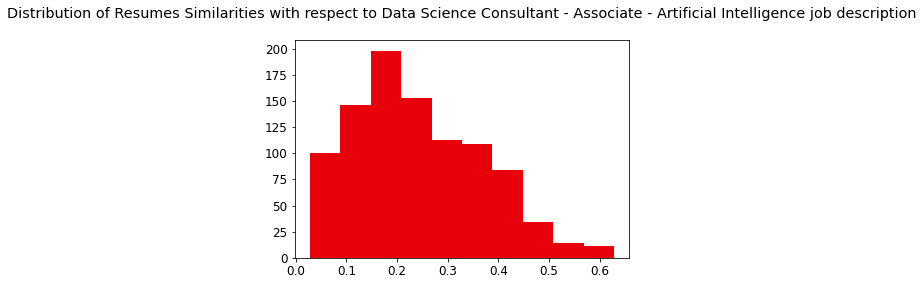

In [ ]:
result,role,company=match_resume_with_job_description_tfidf("Jobs.csv","Resume.csv",0)      
df=pd.DataFrame (result, columns = ['Applicantion_ID','Similarity','Category'])
match=df.nlargest(n=10, columns=['Similarity'], keep='all')
print("The best 10 applicantions of '", role,"' Role at ",company,'Company:\n\n',match.head(10))
plt.hist(list(list(zip(*result))[1]),color='r');
plt.title(f'Distribution of Resumes Similarities with respect to {role} job description\n') 

The best 10 applicantions of ' Data Science Manager ' Role at  Isharat Company:

      Applicantion_ID  Similarity      Category
3                  3    0.600887  Data Science
13                13    0.600887  Data Science
23                23    0.600887  Data Science
33                33    0.600887  Data Science
0                  0    0.558734  Data Science
10                10    0.558734  Data Science
20                20    0.558734  Data Science
30                30    0.558734  Data Science
719              719    0.545617      Database
730              730    0.545617      Database


Text(0.5, 1.0, 'Distribution of Resumes Similarities with respect to Data Science Manager job description\n')

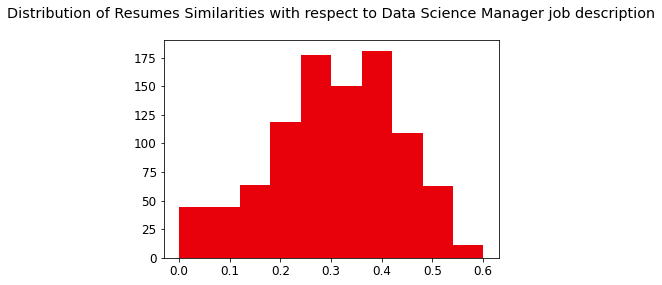

In [ ]:
result,role,company=match_resume_with_job_description_tfidf("Jobs.csv","Resume.csv",1)      
df=pd.DataFrame (result, columns = ['Applicantion_ID','Similarity','Category'])
match=df.nlargest(n=10, columns=['Similarity'], keep='all')
print("The best 10 applicantions of '", role,"' Role at ",company,'Company:\n\n',match.head(10))
plt.hist(list(list(zip(*result))[1]),color='r');
plt.title(f'Distribution of Resumes Similarities with respect to {role} job description\n') 

The best 10 applicantions of ' Machine Learning Engineer, Predictive Analytics ' Role at  IQVIA Company:

     Applicantion_ID  Similarity      Category
7                 7    0.538468  Data Science
17               17    0.538468  Data Science
27               27    0.538468  Data Science
37               37    0.538468  Data Science
6                 6    0.479245  Data Science
16               16    0.479245  Data Science
26               26    0.479245  Data Science
36               36    0.479245  Data Science
8                 8    0.446690  Data Science
18               18    0.446690  Data Science


Text(0.5, 1.0, 'Distribution of Resumes Similarities with respect to Machine Learning Engineer, Predictive Analytics job description\n')

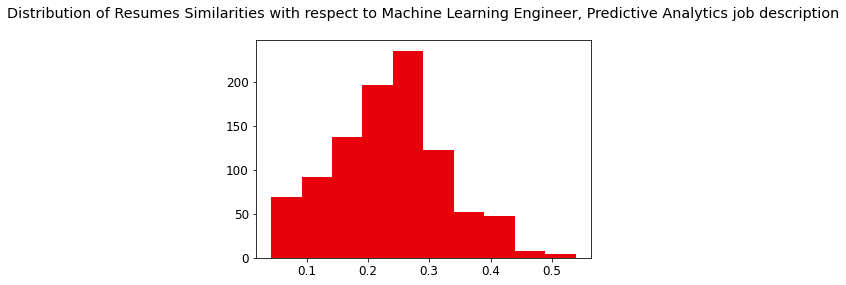

In [ ]:
result,role,company=match_resume_with_job_description_tfidf("Jobs.csv","Resume.csv",600)      
df=pd.DataFrame (result, columns = ['Applicantion_ID','Similarity','Category'])
match=df.nlargest(n=10, columns=['Similarity'], keep='all')
print("The best 10 applicantions of '", role,"' Role at ",company,'Company:\n\n',match.head(10))
plt.hist(list(list(zip(*result))[1]),color='r');
plt.title(f'Distribution of Resumes Similarities with respect to {role} job description\n') 


# 3. LDA Model

    a. Create corpus by CountVectorizer

In [ ]:
from sklearn.feature_extraction.text import CountVectorizer
from sklearn.metrics.pairwise import cosine_similarity 
from sklearn.decomposition import LatentDirichletAllocation
from gensim.corpora import Dictionary
from gensim.models import LdaModel
from gensim.matutils import cossim

#Choose randomly two docs from the two dataset:
jobdesc=j_df.loc[0, 'Clean_Job_Descriptions']
resume= r_df.loc[719, 'Cleaned_Resume']

#Build the corpus
vec = CountVectorizer(stop_words='english')
corpus = vec.fit_transform([jobdesc])
corpus

<1x258 sparse matrix of type '<class 'numpy.int64'>'
	with 258 stored elements in Compressed Sparse Row format>

In [ ]:
corpus.todense()

matrix([[ 1,  1,  1,  2,  1,  1,  2,  5,  1,  1,  1,  1,  1,  1,  2,  1,
          1,  1,  1,  2,  1,  1,  1,  1,  1,  1,  1,  1,  1,  2,  1,  1,
          1,  2, 16,  1,  2,  1,  1,  2,  1,  5,  1,  2,  1,  1,  1,  1,
          3,  1,  1,  1,  2,  1,  1,  1,  1,  2,  1,  1,  1,  1, 14,  1,
          2,  1,  2,  3,  1,  1,  1,  1,  2,  2,  1,  1,  2,  2,  2,  1,
          1,  1,  1,  1,  1,  1,  2,  2,  1,  1,  1,  2,  1,  1,  1,  1,
          2,  1,  1,  3,  1,  1,  1,  3,  1,  1,  1,  1,  1,  1,  1,  1,
          1,  2,  1,  1,  1,  1,  2,  2,  2,  1,  1,  1,  2,  1,  1,  4,
          2,  1,  1,  1,  1,  1,  1,  3,  1,  2,  1,  3,  1,  1,  1,  1,
          3,  2,  1,  1,  1,  1,  1,  1,  1,  1,  1,  1,  2,  1,  1,  1,
          1,  2,  1,  1,  4,  1,  1,  1,  4,  1,  1,  1,  1,  1,  1,  2,
          1,  2,  1,  1,  1,  2,  1,  1,  1,  1,  7,  1,  1,  1,  1,  1,
          1,  1,  2,  1,  1,  1,  2,  1,  1,  8,  2,  2,  2,  1,  1,  3,
          2,  7,  1,  1,  2,  1,  1,  1,  1,  1,  1

In [ ]:
# Build and train LDA on job desc doc
lda_model = LatentDirichletAllocation(n_components=3, max_iter=3, n_jobs = -1, verbose=1)    
document_topics= lda_model.fit_transform(corpus)   

iteration: 1 of max_iter: 3
iteration: 2 of max_iter: 3
iteration: 3 of max_iter: 3


In [ ]:
document_topics

array([[8.37797980e-04, 9.98324404e-01, 8.37797984e-04]])

In [ ]:
print(f'Corpus size: {corpus.shape}')
print(f'lda: map of words (components_): {lda_model.components_.shape}')
print(f'lda: map of document (doc_topic_): {document_topics.shape}')

Corpus size: (1, 258)
lda: map of words (components_): (3, 258)
lda: map of document (doc_topic_): (1, 3)


In [ ]:
def print_LDA_topics(model_components, vectorizer_dict, top_n_words=15):
    topics = []
    for i, topic_dist in enumerate( model_components ): # iterate over all topics.
        top_word_ids = np.argsort(topic_dist)[:-top_n_words:-1] # order terms by their weight in the current topic
        topic_words = [ vectorizer_dict[id] for id in top_word_ids ] # replace term ids with their text.  
        topics.append(topic_words)
        print('Topic {0:d}: {1:s}'.format(i, ' '.join(topic_words)))
    return topics

In [ ]:
topics = print_LDA_topics(lda_model.components_, vec.get_feature_names())

Topic 0: demonstrate enthusiasts limited takes applydiversity compelling employ oral performance trusted arrangements aim sql able
Topic 1: business data science skills pwc strategy understanding ai clients people organisations team work intelligence
Topic 2: demonstrate limited gcp oral trusted environments enthusiasts stakeholders spanning future sql industry training availability


In [ ]:
#  resume to bag of words: 
bow = vec.transform([resume])
current_document_topics = lda_model.transform(bow)

In [ ]:
current_document_topics

array([[0.00557884, 0.98884232, 0.00557884]])

In [ ]:
bow.todense()

matrix([[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 0, 0, 0, 0, 0, 0,
         0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 0, 0, 5, 0, 0, 0, 0, 0, 0, 3,
         0, 0, 0, 3, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 6,
         0, 0, 0, 0, 0, 0, 2, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,
         0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 2, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,
         0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,
         0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 1, 0, 0, 3, 0, 0, 0, 0, 0, 3, 0,
         0, 0, 0, 0, 0, 0, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,
         0, 0, 0, 1, 0, 0, 0, 0, 0, 0, 1, 2, 0, 1, 0, 0, 0, 0, 0, 1, 1,
         0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 2, 0, 0, 0, 0, 0, 0, 0, 5,
         0, 0, 0, 0, 0, 0, 3, 0, 0, 1, 0, 1, 0, 0, 0, 0, 0, 0, 0, 0, 3,
         0, 1, 2, 0, 0, 0, 0, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,
         0, 1, 0, 0, 0, 0]], dtype=int64)

In [ ]:
similarities=cosine_similarity(document_topics,current_document_topics ).flatten()
print("Resume - Job Similarity =",similarities,"by LDA Model")

Resume - Job Similarity = [0.99997694] by LDA Model


# Top 10 Applications  Function by VEC_ LDA Model

In [ ]:
from sklearn.feature_extraction.text import CountVectorizer
from sklearn.metrics.pairwise import cosine_similarity 
from sklearn.decomposition import LatentDirichletAllocation
from gensim.corpora import Dictionary
from gensim.models import LdaModel
from gensim.matutils import cossim
    
def match_resume_with_job_description_lda_cv(jobsfile,resumefile,job_index):
    
    result=[]
    r_df=pd.read_csv(resumefile)
    r_df = r_df.reset_index()
    r_df.rename(columns = {'index':'Application_ID'}, inplace = True)
    r_df['Cleaned_Resume'] = r_df.Resume.apply(lambda x: preprocess(x))
    j_df=pd.read_csv(jobsfile,encoding = 'ISO-8859-1')
    j_df = j_df.reset_index()
    j_df.rename(columns = {'index':'Job_ID'}, inplace = True)
    j_df['Clean_Job_Descriptions'] = j_df.Job_description.apply(lambda x: preprocess(x))
    
    for r in range(0,len(r_df["Application_ID"])):
        
        jobdesc=j_df['Clean_Job_Descriptions'][job_index]
        resume=r_df["Cleaned_Resume"][r]
    
        #Build the corpus
        vec = CountVectorizer(stop_words='english')
        corpus = vec.fit_transform([jobdesc])
        # train LDA
        lda_model = LatentDirichletAllocation(n_components=2, max_iter=2)    
        document_topics= lda_model.fit_transform(corpus) 
    
        bow = vec.transform([resume])
        current_document_topics = lda_model.transform(bow)
    
        similarity=float(cosine_similarity(document_topics,current_document_topics ).flatten())
        
        role=j_df['Role'][job_index]
        company= j_df["Company"][job_index]
        category=r_df["Category"][r]
       
        result.append([r,similarity,category])   
        
    return  result,role,company

# Results

The best 10 applicantions of ' Data Science Consultant - Associate - Artificial Intelligence ' Role at  PwC Company:

      Applicantion_ID  Similarity            Category
539              539    1.000000  Operations Manager
547              547    1.000000  Operations Manager
515              515    1.000000  Operations Manager
519              519    1.000000  Operations Manager
543              543    1.000000  Operations Manager
531              531    1.000000  Operations Manager
535              535    1.000000  Operations Manager
523              523    1.000000  Operations Manager
527              527    1.000000  Operations Manager
511              511    0.999999  Operations Manager


Text(0.5, 1.0, 'Distribution of Resumes Similarities with respect to Data Science Consultant - Associate - Artificial Intelligence job description\n')

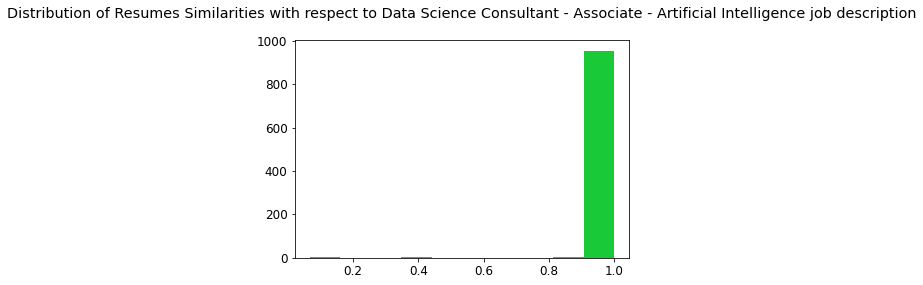

In [ ]:
result,role,company=match_resume_with_job_description_lda_cv("Jobs.csv","Resume.csv",0)      
df=pd.DataFrame (result, columns = ['Applicantion_ID','Similarity','Category'])
match=df.nlargest(n=10, columns=['Similarity'], keep='all')
print("The best 10 applicantions of '", role,"' Role at ",company,'Company:\n\n',match.head(10))
plt.hist(list(list(zip(*result))[1]),color='g');
plt.title(f'Distribution of Resumes Similarities with respect to {role} job description\n') 

The best 10 applicantions of ' Data Engineer Machine Learning Python R ' Role at  Client Server Company:

      Applicantion_ID  Similarity          Category
7                  7         1.0      Data Science
27                27         1.0      Data Science
17                17         1.0      Data Science
37                37         1.0      Data Science
414              414         1.0  Business Analyst
406              406         1.0  Business Analyst
420              420         1.0  Business Analyst
410              410         1.0  Business Analyst
424              424         1.0  Business Analyst
428              428         1.0  Business Analyst


Text(0.5, 1.0, 'Distribution of Resumes Similarities with respect to Data Engineer Machine Learning Python R job description\n')

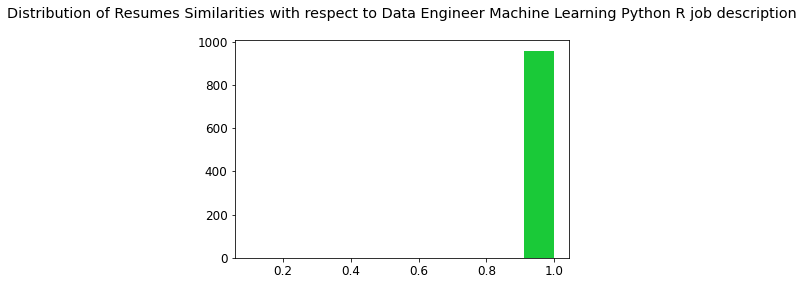

In [ ]:
result,role,company=match_resume_with_job_description_lda_cv("Jobs.csv","Resume.csv",100)      
df=pd.DataFrame (result, columns = ['Applicantion_ID','Similarity','Category'])
match=df.nlargest(n=10, columns=['Similarity'], keep='all')
print("The best 10 applicantions of '", role,"' Role at ",company,'Company:\n\n',match.head(10))
plt.hist(list(list(zip(*result))[1]),color='g');
plt.title(f'Distribution of Resumes Similarities with respect to {role} job description\n') 

# Alternatively:

    b. create corpus by doc2bow

In [ ]:
jobs=[j_df.loc[20, 'Clean_Job_Descriptions']]
jobs

['use management data becoming ever important modern economy data science driving competitiveness better public services improving lives citizens order realise potential new data sources hold need alive opportunities arise ensure people right skills unleash innovation data science throughout public sector data analytics apprentice primary role collect organize study data provide business insight typical day involve managing cleansing abstracting aggregating data alongside conducting range analytical studies data expected document report results data analysis activities making recommendations improve business performance part job also demonstrate competence towards level 4 data analytics apprenticeship assessment develop good understanding data structures database systems procedures range analytical tools used undertake range different analyses exciting opportunity get world work earn money gain diploma apprenticeship responsibilities different business areas various government departme

In [ ]:
jobs = [doc.split() for doc in jobs]
jobs

[['use',
  'management',
  'data',
  'becoming',
  'ever',
  'important',
  'modern',
  'economy',
  'data',
  'science',
  'driving',
  'competitiveness',
  'better',
  'public',
  'services',
  'improving',
  'lives',
  'citizens',
  'order',
  'realise',
  'potential',
  'new',
  'data',
  'sources',
  'hold',
  'need',
  'alive',
  'opportunities',
  'arise',
  'ensure',
  'people',
  'right',
  'skills',
  'unleash',
  'innovation',
  'data',
  'science',
  'throughout',
  'public',
  'sector',
  'data',
  'analytics',
  'apprentice',
  'primary',
  'role',
  'collect',
  'organize',
  'study',
  'data',
  'provide',
  'business',
  'insight',
  'typical',
  'day',
  'involve',
  'managing',
  'cleansing',
  'abstracting',
  'aggregating',
  'data',
  'alongside',
  'conducting',
  'range',
  'analytical',
  'studies',
  'data',
  'expected',
  'document',
  'report',
  'results',
  'data',
  'analysis',
  'activities',
  'making',
  'recommendations',
  'improve',
  'business',
 

In [ ]:
dictionary = Dictionary(jobs)
corpus = [dictionary.doc2bow(doc) for doc in jobs]
corpus[0]

[(0, 1),
 (1, 3),
 (2, 1),
 (3, 3),
 (4, 6),
 (5, 1),
 (6, 5),
 (7, 1),
 (8, 1),
 (9, 2),
 (10, 1),
 (11, 2),
 (12, 1),
 (13, 1),
 (14, 1),
 (15, 1),
 (16, 1),
 (17, 1),
 (18, 1),
 (19, 1),
 (20, 1),
 (21, 2),
 (22, 2),
 (23, 1),
 (24, 13),
 (25, 2),
 (26, 4),
 (27, 3),
 (28, 1),
 (29, 1),
 (30, 1),
 (31, 4),
 (32, 2),
 (33, 2),
 (34, 1),
 (35, 13),
 (36, 1),
 (37, 1),
 (38, 1),
 (39, 1),
 (40, 1),
 (41, 2),
 (42, 1),
 (43, 2),
 (44, 1),
 (45, 1),
 (46, 1),
 (47, 2),
 (48, 3),
 (49, 1),
 (50, 1),
 (51, 1),
 (52, 2),
 (53, 1),
 (54, 3),
 (55, 1),
 (56, 1),
 (57, 2),
 (58, 2),
 (59, 1),
 (60, 1),
 (61, 1),
 (62, 1),
 (63, 2),
 (64, 2),
 (65, 1),
 (66, 1),
 (67, 3),
 (68, 1),
 (69, 1),
 (70, 1),
 (71, 1),
 (72, 1),
 (73, 2),
 (74, 1),
 (75, 1),
 (76, 1),
 (77, 1),
 (78, 3),
 (79, 1),
 (80, 3),
 (81, 1),
 (82, 1),
 (83, 2),
 (84, 1),
 (85, 1),
 (86, 1),
 (87, 4),
 (88, 1),
 (89, 1),
 (90, 34),
 (91, 2),
 (92, 1),
 (93, 1),
 (94, 3),
 (95, 1),
 (96, 2),
 (97, 2),
 (98, 1),
 (99, 1),
 (100, 

In [ ]:
# Training the model
model = LdaModel(corpus=corpus, id2word=dictionary, num_topics=3) 

In [ ]:
resumes= [r_df.loc[500, 'Cleaned_Resume']]
resumes

['education details january 2012 january 2013 b e electrical shivaji university september 2008 hsc pune maharashtra pune university july 2006 ssc pune maharashtra pune university electrical engineer electrical engineer r k electrical pvt ltd skill details company details company r k electrical pvt ltd description experience 1 year 3 months troubleshooting maintenance following electrical equipment type maintenance utility electrical mechanical maintenance two 625 kva diesel generator set kirloskar ht lt switchgear protection system using relays provision interlocking c kirloskar handling ht vacuum sf6 circuit breaker transformer 5000 kva lt air circuit breaker 2000a maintenance stp wtp plant maintenance air blower actuators soft starter eot crane mono rail centrifugal vertical pumps hydraulic machine rolling machine lath machine drill machine ahu hvac chiller etc basic knowledge plc scada operation trouble shooting switchgear control panel pump motor maintenance ups battery charger bat

In [ ]:
resumes = [doc.split() for doc in resumes]

In [ ]:
#build the corpus
test_corpus = [dictionary.doc2bow(doc) for doc in resumes]
test_corpus[0]

[(0, 1),
 (3, 1),
 (55, 1),
 (62, 1),
 (92, 4),
 (106, 1),
 (132, 1),
 (138, 1),
 (180, 2),
 (191, 1),
 (197, 1),
 (225, 1),
 (256, 1),
 (299, 1),
 (301, 1),
 (307, 1),
 (318, 1),
 (342, 1),
 (346, 1),
 (357, 1),
 (359, 2),
 (363, 4)]

In [ ]:
#Find the similarity between the job desc and the resume 
doc1 = model.get_document_topics(corpus[0], minimum_probability=0)
doc2 = model.get_document_topics(test_corpus[0], minimum_probability=0)
similarity=cossim(doc1, doc2)
    
print("Resume - Job Similarity =",similarity,"by LDA Model")

Resume - Job Similarity = 0.9998559150185403 by LDA Model


# Top 10 Applications Function by doc2bow_LDA Model

In [ ]:
from sklearn.feature_extraction.text import CountVectorizer
from sklearn.metrics.pairwise import cosine_similarity 
from sklearn.decomposition import LatentDirichletAllocation
from gensim.corpora import Dictionary
from gensim.models import LdaModel
from gensim.matutils import cossim
    
def match_resume_with_job_description_lda_doc2bow(jobsfile,resumefile,job_index):
    
    result=[]
    r_df=pd.read_csv(resumefile)
    r_df = r_df.reset_index()
    r_df.rename(columns = {'index':'Application_ID'}, inplace = True)
    r_df['Cleaned_Resume'] = r_df.Resume.apply(lambda x: preprocess(x))
    j_df=pd.read_csv(jobsfile,encoding = 'ISO-8859-1')
    j_df = j_df.reset_index()
    j_df.rename(columns = {'index':'Job_ID'}, inplace = True)
    j_df['Clean_Job_Descriptions'] = j_df.Job_description.apply(lambda x: preprocess(x))
    
    for r in range(0,len(r_df["Application_ID"])):
        
        jobs=[j_df['Clean_Job_Descriptions'][job_index]]
        resumes=[r_df["Cleaned_Resume"][r]]
        
        jobs = [doc.split() for doc in jobs]
        dictionary = Dictionary(jobs)
        corpus = [dictionary.doc2bow(doc) for doc in jobs]
        
        # Training the model
        model = LdaModel(corpus=corpus, id2word=dictionary, num_topics=3) 
        resumes = [doc.split() for doc in resumes]
        test_corpus = [dictionary.doc2bow(doc) for doc in resumes]
        
        
        doc1 = model.get_document_topics(corpus[0], minimum_probability=0)
        doc2 = model.get_document_topics(test_corpus[0], minimum_probability=0)
        similarity=cossim(doc1, doc2)
        
        role=j_df['Role'][job_index]
        company= j_df["Company"][job_index]
        similarity=cossim(doc1, doc2)
        category=r_df["Category"][r]  
        result.append([r,similarity,category])   
        
    return  result,role,company

# Results:

The best 10 applicantions of ' Data Science Consultant - Associate - Artificial Intelligence ' Role at  PwC Company:

      Applicantion_ID  Similarity            Category
511              511    1.000000  Operations Manager
523              523    1.000000  Operations Manager
515              515    1.000000  Operations Manager
547              547    1.000000  Operations Manager
526              526    0.999999  Operations Manager
534              534    0.999999  Operations Manager
546              546    0.999999  Operations Manager
542              542    0.999999  Operations Manager
538              538    0.999999  Operations Manager
550              550    0.999999  Operations Manager


Text(0.5, 1.0, 'Distribution of Resumes Similarities with respect to Data Science Consultant - Associate - Artificial Intelligence job description\n')

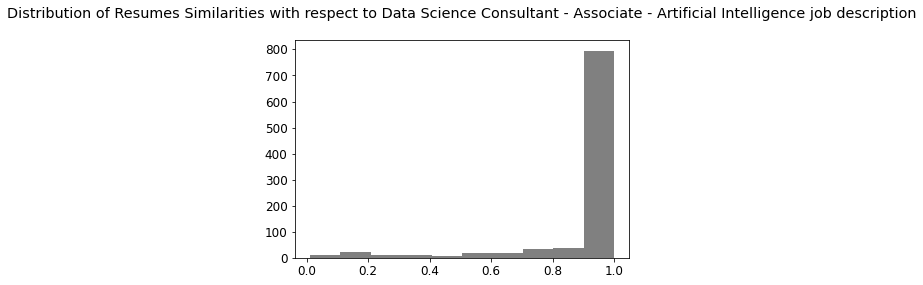

In [ ]:
result,role,company=match_resume_with_job_description_lda_doc2bow("Jobs.csv","Resume.csv",0)      
df=pd.DataFrame (result, columns = ['Applicantion_ID','Similarity','Category'])
match=df.nlargest(n=10, columns=['Similarity'], keep='all')
print("The best 10 applicantions of '", role,"' Role at ",company,'Company:\n\n',match.head(10))
plt.hist(list(list(zip(*result))[1]),color='gray');
plt.title(f'Distribution of Resumes Similarities with respect to {role} job description\n') 

The best 10 applicantions of ' Fraud Data Scientist ' Role at  Harnham Company:

      Applicantion_ID  Similarity            Category
3                  3    1.000000        Data Science
33                33    1.000000        Data Science
457              457    1.000000  Automation Testing
542              542    0.999999  Operations Manager
530              530    0.999999  Operations Manager
550              550    0.999999  Operations Manager
538              538    0.999999  Operations Manager
518              518    0.999999  Operations Manager
514              514    0.999999  Operations Manager
602              602    0.999999     DevOps Engineer


Text(0.5, 1.0, 'Distribution of Resumes Similarities with respect to Fraud Data Scientist job description\n')

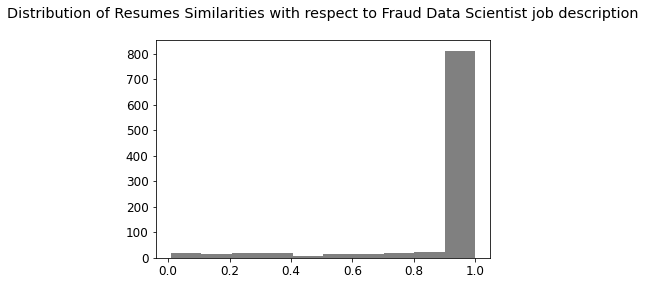

In [ ]:
result,role,company=match_resume_with_job_description_lda_doc2bow("Jobs.csv","Resume.csv",200)      
df=pd.DataFrame (result, columns = ['Applicantion_ID','Similarity','Category'])
match=df.nlargest(n=10, columns=['Similarity'], keep='all')
print("The best 10 applicantions of '", role,"' Role at ",company,'Company:\n\n',match.head(10))
plt.hist(list(list(zip(*result))[1]),color='gray');
plt.title(f'Distribution of Resumes Similarities with respect to {role} job description\n') 

# Choosing the Optimal Number of Topics by Coherence Values

In [ ]:
corpus = j_df['Job_description']

In [ ]:
import nltk 

wpt = nltk.WordPunctTokenizer()
stop_words = nltk.corpus.stopwords.words('english')
lemmatizer = nltk.WordNetLemmatizer()

#Function to pre-process the text information

def normalize_document(doc):
    
    # lower case and remove special characters\whitespaces
    doc = re.sub(r'[^a-zA-Z\s]', '', doc, re.I|re.A) #re.I (ignore case), re.A (ASCII-only matching)
    doc = doc.lower()
    doc = doc.strip()
    
    # tokenize document
    tokens = wpt.tokenize(doc)
    
    # filter stopwords out of document
    filtered_tokens = [token for token in tokens if token not in stop_words]
    
    # Lemmatise document from filtered tokens
    lem_text = [lemmatizer.lemmatize(i) for i in filtered_tokens]
    
    # Remove words that are only one character.
    lem_text = [token for token in lem_text if len(token) > 1]
    
    # Remove numbers, but not words that contain numbers.
    lem_text = [token for token in lem_text if not token.isnumeric()]
    
    doc = ' '.join(lem_text)
    return doc

normalize_corpus = np.vectorize(normalize_document)

norm_corpus = normalize_corpus(corpus)

In [ ]:
from nltk.tokenize import word_tokenize
import gensim.corpora as corpora

#Tokenise the corpus
tokenized_corp = [word_tokenize(i) for i in norm_corpus]

# Create Dictionary
id2word = corpora.Dictionary(tokenized_corp)

#Remove words that don't feature 20 times and those that feature in over 50% of documents
id2word.filter_extremes(no_below=20, no_above=0.5)

texts = tokenized_corp

# Term Document Frequency
corpus = [id2word.doc2bow(text) for text in texts]

In [ ]:
tokenized_corp

[['background',
  'pwc',
  'trusted',
  'adviser',
  'largest',
  'organisation',
  'around',
  'world',
  'spanning',
  'public',
  'private',
  'financial',
  'sector',
  'increasing',
  'availability',
  'use',
  'data',
  'requires',
  'organisation',
  'adapt',
  'quickly',
  'face',
  'irrelevance',
  'different',
  'technology',
  'strategy',
  'recognises',
  'aim',
  'keep',
  'frontier',
  'change',
  'part',
  'strategy',
  'currently',
  'looking',
  'consultant',
  'join',
  'artificial',
  'intelligence',
  'ai',
  'team',
  'london',
  'looking',
  'selfstarters',
  'quick',
  'learner',
  'technology',
  'enthusiast',
  'develop',
  'build',
  'current',
  'artificial',
  'intelligence',
  'data',
  'science',
  'proposition',
  'role',
  'business',
  'increasingly',
  'looking',
  'towards',
  'data',
  'science',
  'solution',
  'consultant',
  'ai',
  'team',
  'work',
  'business',
  'alongside',
  'data',
  'scientist',
  'engineer',
  'use',
  'technique',
  'mac

In [ ]:
corpus

[[(0, 1),
  (1, 1),
  (2, 1),
  (3, 2),
  (4, 1),
  (5, 2),
  (6, 4),
  (7, 2),
  (8, 1),
  (9, 1),
  (10, 1),
  (11, 2),
  (12, 1),
  (13, 1),
  (14, 1),
  (15, 1),
  (16, 1),
  (17, 2),
  (18, 1),
  (19, 1),
  (20, 1),
  (21, 2),
  (22, 2),
  (23, 1),
  (24, 1),
  (25, 1),
  (26, 2),
  (27, 3),
  (28, 2),
  (29, 1),
  (30, 5),
  (31, 1),
  (32, 1),
  (33, 1),
  (34, 1),
  (35, 3),
  (36, 2),
  (37, 1),
  (38, 1),
  (39, 1),
  (40, 1),
  (41, 2),
  (42, 1),
  (43, 1),
  (44, 1),
  (45, 1),
  (46, 2),
  (47, 1),
  (48, 2),
  (49, 1),
  (50, 2),
  (51, 3),
  (52, 1),
  (53, 1),
  (54, 1),
  (55, 1),
  (56, 2),
  (57, 1),
  (58, 1),
  (59, 2),
  (60, 1),
  (61, 1),
  (62, 1),
  (63, 1),
  (64, 2),
  (65, 1),
  (66, 1),
  (67, 1),
  (68, 2),
  (69, 2),
  (70, 1),
  (71, 2),
  (72, 1),
  (73, 2),
  (74, 1),
  (75, 1),
  (76, 3),
  (77, 1),
  (78, 1),
  (79, 1),
  (80, 3),
  (81, 1),
  (82, 1),
  (83, 1),
  (84, 1),
  (85, 1),
  (86, 1),
  (87, 1),
  (88, 1),
  (89, 1),
  (90, 2),
  (91, 1)

In [ ]:
def compute_coherence_values(corpus, dictionary, texts, end, start=2, step=3):
    """
    Compute c_v coherence for various number of topics

    Parameters:
    ----------
    dictionary : Gensim dictionary
    corpus : Gensim corpus
    texts : List of input texts
    limit : Max num of topics

    Returns:
    -------
    model_list : List of LDA topic models
    coherence_values : Coherence values corresponding to the LDA model with respective number of topics
    """
    coherence_values = []
    model_list = []
    
    for num_topics in range(start, end, step):
    
        # Build LDA model
        lda_model = gensim.models.LdaMulticore(corpus=corpus,
                                               id2word=dictionary,
                                               num_topics=num_topics, 
                                               random_state=123,
                                               chunksize=100,
                                               passes=500, #number of passes was investigated. At 500 the coherence score will remain relatively similar
                                               #with any further increase. As the document is quite small this number of passes makes sense.
                                               per_word_topics=True)
        model_list.append(lda_model)
        
        # Compute Coherence Score
        coherence_model_lda = CoherenceModel(model=lda_model, texts=texts, dictionary=dictionary, coherence='c_v')
        coherence_values.append(coherence_model_lda.get_coherence())

    return model_list, coherence_values

#Using coherence values to find the optimal number of topics 
model_list, coherence_values = compute_coherence_values(corpus=corpus, dictionary = id2word, texts=texts, start=8, end=16, step=1)

In [ ]:
model_list

In [ ]:
coherence_values

[0.4421146556732941,
 0.44367413099652925,
 0.4163012761006318,
 0.43850818989830276,
 0.4582435104151304,
 0.45375648380560535,
 0.4395539035540668,
 0.4499372363328688]

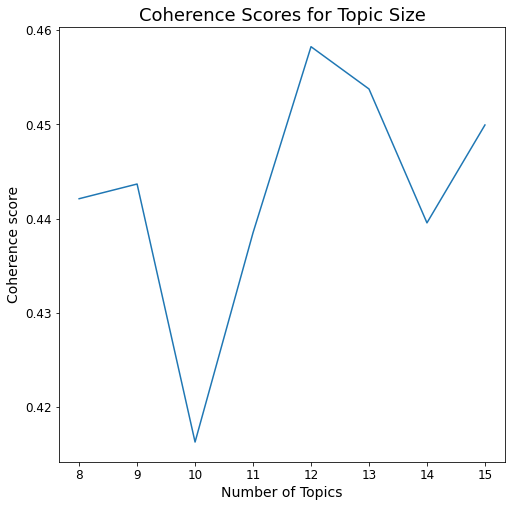

In [ ]:
# Show graph: the optimal number of topics is 12 
end=16; start=8; step=1;
x = range(start, end, step)
ax = plt.subplots(figsize=(8,8))
plt.plot(x, coherence_values)
plt.xlabel("Number of Topics", fontsize=14)
plt.ylabel("Coherence score", fontsize=14)
plt.title('Coherence Scores for Topic Size', fontsize=18)
plt.show();

# PCA: Display Summary of all the Topics  of all Job desciptions Postings

In [ ]:
#Build the corpus
vec = CountVectorizer(stop_words='english')
corpus = vec.fit_transform(j_df['Clean_Job_Descriptions'])
lda_model = LatentDirichletAllocation(n_components=12, max_iter=2, n_jobs = -1, verbose=1)    
document_topics= lda_model.fit_transform(corpus) 

iteration: 1 of max_iter: 2
iteration: 2 of max_iter: 2


In [ ]:
from sklearn.decomposition import PCA
pca_model = PCA(n_components=2)
pca_res = pca_model.fit_transform(document_topics)

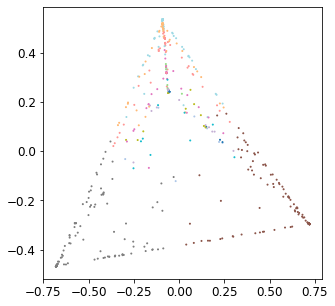

In [ ]:
max_topic_id = document_topics.argmax(axis=1)
plt.figure(figsize=(5,5))
plt.scatter(pca_res[:,0], pca_res[:,1],s=1, c=max_topic_id,cmap = 'tab20')

# TSNE: Display Summary of all the Topics  of all Job desciptions Postings

In [ ]:
from sklearn.manifold import TSNE
TSNE_res = TSNE(n_jobs=-1).fit_transform(document_topics)

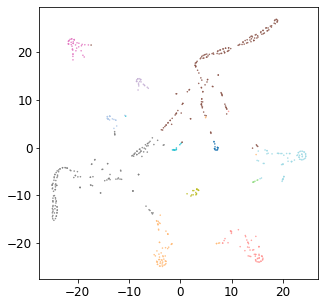

In [ ]:
max_topic_id = document_topics.argmax(axis=1)
plt.figure(figsize=(5,5))
plt.scatter(TSNE_res[:, 0], TSNE_res[:, 1], c=max_topic_id, cmap = 'tab20', marker='.', s=1)
plt.show()

# Search: Job Recomendation for Specific Resume (Applicant)

# 4. Doc2Vec

In [ ]:
from gensim.summarization import keywords
from gensim.models.doc2vec import TaggedDocument
from gensim import models


jd = j_df['Job_description'].tolist()
companies = j_f['Company'].tolist()
positions = j_df['Role'].tolist()


docs = []
for i in range(len(jd)):
    sent = TaggedDocument(words = jd[i].split(),tags = ['{}_{}'.format(companies[i], i)])
    docs.append(sent)
    
#build and train the model on job desc    
model = models.Doc2Vec(alpha=.025, min_alpha=.025, min_count=1,epochs=10)
#build vocab
model.build_vocab(docs)
model.train(docs, total_examples=model.corpus_count, epochs=model.epochs)

resume=r_df["Resume"]
    
#test the model on the resumes
data = []
for i in range(len(jd)):
    data.append(model.docvecs[i])

data.append(model.infer_vector(resume))

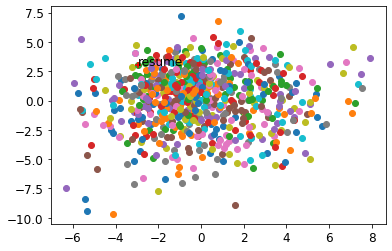

In [ ]:
#plot the resume, job desc vectors 

from sklearn.manifold import MDS
mds = MDS(n_components=2, random_state=1)
pos = mds.fit_transform(data)
#print pos
xs,ys = pos[:,0], pos[:,1]
for x, y in zip(xs, ys):
    plt.scatter(x, y)
xs2,ys2 = xs[-1], ys[-1]
plt.scatter(xs2, ys2, c='Red', marker='+')
plt.text(xs2,ys2,'resume')
plt.savefig('distance.png')
plt.show()

# Find the best applicants (resumes) for specific job description

In [ ]:
from gensim.models.doc2vec import Doc2Vec, TaggedDocument
from nltk.tokenize import word_tokenize

#Under Doc2Vec we  attempted on creating our own model with all the job description tags 
#but  that was not a great idea as then would have a single vector representation of all the Job Description postings.

#The trained data:
data=r_df["Cleaned_Resume"]


def output_sentences(most_similar):
    for label, index in [('MOST:', 0), ('SECOND-MOST:', 1), ('MEDIAN:', len(most_similar)//2), ('LEAST:', len(most_similar) - 1)]:
        print(u'%s %s: %s\n' % (label, most_similar[index][1], data[int(most_similar[index][0])]))

tagged_data = [TaggedDocument(words=word_tokenize(_d.lower()), tags=[str(i)]) for i, _d in enumerate(data)]
max_epochs = 10
vec_size = 20
alpha = 0.025

#Build the model
model = Doc2Vec(vector_size=vec_size,
                alpha=alpha, 
                min_alpha=0.00025,
                min_count=1,
                dm =1,epochs=10)

#build the vocab
model.build_vocab(tagged_data)

#Train the data "r_df["Cleaned_Resume"]"

for epoch in range(max_epochs):
    print('iteration {0}'.format(epoch))
    model.train(tagged_data,
                total_examples=model.corpus_count,
                epochs=model.epochs)
    # decrease the learning rate
    model.alpha -= 0.0002
    # fix the learning rate, no decay
    model.min_alpha = model.alpha

iteration 0
iteration 1
iteration 2
iteration 3
iteration 4
iteration 5
iteration 6
iteration 7
iteration 8
iteration 9


In [ ]:
#save the model

model.save("d2v.model")
print("Model Saved")
model= Doc2Vec.load("d2v.model")

Model Saved


In [ ]:
#to find the vector of a document which is not in training data
query=j_df.loc[0,"Clean_Job_Descriptions"]
query

'background pwc trusted adviser largest organisations around world spanning public private financial sectors increasing availability use data requires organisations adapt quickly face irrelevance different technology strategy recognises aims keep us frontier change part strategy currently looking consultants join artificial intelligence ai team london looking self starters quick learners technology enthusiasts develop build current artificial intelligence data science propositions role business increasingly looking towards data science solution consultant ai team work business alongside data scientists engineers use techniques machine learning natural language processing realise authentic data driven change solutions team reports board works clients senior leadership across four business units enhance performance create valuable impact specific responsibilities include limited responsibilities involved design development data science projects pwc clients support senior management proje

In [ ]:
#test on query  (job desc) by the traind model
test_data = word_tokenize(query)
v1 = model.infer_vector(test_data)
print("V1_infer", v1)

V1_infer [ 1.5492501  -1.2895781  -0.6218191  -1.0151274  -2.240217    1.6967628
 -1.7571697  -4.418387   -3.175381   -1.2071899   1.1918652   1.1375773
 -3.173376    0.9076082  -0.41101116 -0.9432853  -3.2007787  -1.5132892
 -1.6870118   0.02678016]


In [ ]:
# to find most similar doc using tags
similar_doc = model.docvecs.most_similar([v1])
print("Top 10 Applications by doc2vec:")
similar_doc

Top 10 Applications by doc2vec:


[('36', 0.5537666082382202),
 ('26', 0.550061047077179),
 ('6', 0.5479797124862671),
 ('29', 0.5424166917800903),
 ('16', 0.5349057912826538),
 ('19', 0.4986478090286255),
 ('9', 0.4947051405906677),
 ('39', 0.4924022853374481),
 ('433', 0.44777190685272217),
 ('445', 0.43763989210128784)]

In [ ]:
# to print similar docs
output_sentences(similar_doc) 

MOST: 0.5537666082382202: skills python tableau data visualization r studio machine learning statistics iabac certified data scientist versatile experience 1 years managing business data science consulting leading innovation projects bringing business ideas working real world solutions strong advocator augmented era human capabilities enhanced machines fahed passionate bringing business concepts area machine learning ai robotics etc real life solutions education details january 2017 b tech computer science engineering mohali punjab indo global college engineering data science consultant data science consultant datamites skill details machine learning exprience 13 months python exprience 24 months solutions exprience 24 months data science exprience 24 months data visualization exprience 24 months tableau exprience 24 monthscompany details company datamites description analyzed processed complex data sets using advanced querying visualization analytics tools responsible loading extracti

In [ ]:
# to find vector of doc in training data using tags or in other words, printing the vector of document at index 1 in training data
print(model.docvecs['1'])

[ 1.2518417 -3.4296474  2.1325207  4.0286636 -0.7092114  6.5185823
  1.195863  -1.5980102 -3.0157735  3.3039656  1.5530049  0.3994689
  0.7811674  1.4460347  6.940476   3.5455842 -0.9164659  0.3125658
  1.3361344 -4.238711 ]


# 5. Word Embedding

In [ ]:
!pip install sentence-transformers

  Created wheel for sentence-transformers: filename=sentence_transformers-2.2.0-py3-none-any.whl size=120748 sha256=53a5bfd2f0477ee336882867f192c0633ccebcc9bd16a446d70d082235b96a42
  Stored in directory: c:\users\ismaeel\appdata\local\pip\cache\wheels\2b\11\3b\32a18fb9f2253b25d3d1a06f0a84e2d516e7efa19c8c71a283
Successfully built sentence-transformers


In [ ]:
'''
Sentence Transformer utilizes the transformer model and sentence encoder to create sentence embeddings,
these encoders preserve the semantic meaning of the sentence and provides better contextuality than other embeddings.
'''
from sentence_transformers import SentenceTransformer
sbert_model = SentenceTransformer('bert-base-nli-mean-tokens')

Downloading:   0%|          | 0.00/391 [00:00<?, ?B/s]

Downloading:   0%|          | 0.00/3.95k [00:00<?, ?B/s]

Downloading:   0%|          | 0.00/2.00 [00:00<?, ?B/s]

Downloading:   0%|          | 0.00/625 [00:00<?, ?B/s]

Downloading:   0%|          | 0.00/122 [00:00<?, ?B/s]

Downloading:   0%|          | 0.00/229 [00:00<?, ?B/s]

Downloading:   0%|          | 0.00/438M [00:00<?, ?B/s]

Downloading:   0%|          | 0.00/53.0 [00:00<?, ?B/s]

Downloading:   0%|          | 0.00/112 [00:00<?, ?B/s]

Downloading:   0%|          | 0.00/466k [00:00<?, ?B/s]

Downloading:   0%|          | 0.00/399 [00:00<?, ?B/s]

Downloading:   0%|          | 0.00/232k [00:00<?, ?B/s]

Downloading:   0%|          | 0.00/190 [00:00<?, ?B/s]

# Best  Applicants (Resume Job Matching)  by Words Embedding

In [ ]:
from gensim.summarization.summarizer import summarize
from gensim.summarization.textcleaner import split_sentences

def h(seq):
    s = set()
    return [y for y in seq if y not in s and not s.add(y)]
 
def summary(x, perc):
    if len(split_sentences(x)) > 2:
        t_sum = summarize(x, ratio = perc, split=True)
        t_sum = '\n'.join(map(str, h(t_sum)))
    else:
        t_sum = x
    return t_sum

#Formula for Cosine Similarity
def cosine(a, b):
    return np.dot(a, b) / (np.linalg.norm(a) * np.linalg.norm(b))
    

job_index=0    
result=[]

r_df['Summary'] = r_df.apply(lambda row: summary(row['Cleaned_Resume'], 0.1), axis=1)
j_df['Summary'] = j_df.apply(lambda row: summary(str(row['Clean_Job_Descriptions']), 0.1), axis=1)
#Create a column containing embeddings generated using sentence transformer for summaries column.
r_df['Embeddings'] = r_df.apply(lambda row: sbert_model.encode(row['Summary']), axis=1)
j_df['Embeddings'] = j_df.apply(lambda row: sbert_model.encode(str(row['Summary'])), axis=1)


def match_resume_with_job_description_embedding(job_index):

    cosines = []
    for i in range(len(r_df)):
        cosines.append(cosine(r_df.iloc[i]['Embeddings'], j_df.iloc[job_index]['Embeddings']))
    print("Index of best candidate is : ", cosines.index(max(cosines)),'with similarity', max(cosines))

match_resume_with_job_description_embedding(0)

Index of best candidate is :  6


In [ ]:
print("Index of best candidate is : ", cosines.index(max(cosines)),'with similarity', max(cosines))

Index of best candidate is :  6 with similarity 0.85714775


In [ ]:
df=pd.DataFrame (cosines, columns = ['Similarity'])
match=df.nlargest(n=10, columns=['Similarity'], keep='all')
print('ID' ,match.head(10))

ID      Similarity
6      0.857148
16     0.857148
26     0.857148
36     0.857148
719    0.833126
730    0.833126
741    0.833126
743    0.826696
750    0.826696
757    0.826696


In [ ]:
df=r_df[['Applicantion_ID','Cleaned_Resume','Summary','Embeddings']]
df.head()

,Applicantion_ID,Cleaned_Resume,Summary,Embeddings
0,0,skills programming languages python pandas num...,skills programming languages python pandas num...,"[-0.48579407, 1.1287568, 0.3529383, 0.38239697..."
1,1,education details may 2013 may 2017 b e uit rg...,education details may 2013 may 2017 b e uit rg...,"[-0.28759128, 1.0566523, 0.28568777, 0.2083249..."
2,2,areas interest deep learning control system de...,areas interest deep learning control system de...,"[-0.24453898, 1.0482582, 0.6277059, 0.09711098..."
3,3,skills r python sap hana tableau sap hana sql ...,skills r python sap hana tableau sap hana sql ...,"[-0.3049553, 1.0736828, 0.81079173, 0.11519936..."
4,4,education details mca ymcaust faridabad haryan...,education details mca ymcaust faridabad haryan...,"[-0.471591, 1.0701611, 0.20403111, 0.41489664,..."


In [ ]:
df=j_df[['Job_ID','Clean_Job_Descriptions','Summary','Embeddings']]
df.head()

,Job_ID,Clean_Job_Descriptions,Summary,Embeddings
0,0,background pwc trusted adviser largest organis...,background pwc trusted adviser largest organis...,"[-0.6036923, 0.78614163, 1.055162, 0.033558644..."
1,1,looking data science manager help clients navi...,looking data science manager help clients navi...,"[-0.5766502, 0.89438796, 1.2430494, 0.16873676..."
2,2,fraud analytics managerlondon currently flexib...,fraud analytics managerlondon currently flexib...,"[-0.64401454, 1.1870322, 0.9419006, 0.25586233..."
3,3,cib applied ai machine learning economic finan...,cib applied ai machine learning economic finan...,"[-0.5888, 1.0973191, 0.101591766, 0.13015941, ..."
4,4,opportunity tax ventures team expanding ai dat...,opportunity tax ventures team expanding ai dat...,"[-0.42869496, 0.45713067, 0.9302575, -0.250375..."


# Another Point of View 

# Jobs Recommender by LDA

In [ ]:
from sklearn.metrics.pairwise import cosine_similarity

query_resume = r_df.loc[10, 'Cleaned_Resume']

query_bow = vec.transform([query_resume])# create bag of words
topcs_vector = lda_model.transform(query_bow) # generate vector of topics
similarities = cosine_similarity(topcs_vector,document_topics)[0] # similarity to every other document. 1: identical. 
sililarity_rank = np.argsort(similarities)[::-1] # rank all topics by their similarity to the query. 
# print results: 
for rank, item_index in enumerate(sililarity_rank[:10]):
    print(f"{rank}.\t{similarities[item_index]:6.6f}\t{j_df['Clean_Job_Descriptions'].iloc[item_index][:500]}")

0.	0.948375	looking data scientists interested using data draw insights result policy changes business process optimisation benefiting public applicant scoping projects stakeholders using data sets across government agencies applying business acumen tease relevant impactful insights presenting insights clear concise manner using appropriate visualisations training working experiences data analytics comfortable hands data manipulation data modelling data visualisation also comfortable engaging stakeholders s
1.	0.941415	senior manager optimisation analytics negotiable salary plus benefits london entrepreneurial company operates within leisure arena dealing millions customers thus collecting vast amounts data every minute every single day role presents real exciting challenges extracting commercial value ever growing volume data unique opportunity utilise real passion data science whilst directly influencing bottom line working brightest minds tech industry energetic international work e

# Jobs Recommender by Doc2Vec

In [ ]:
#data to train 
data =j_df["Clean_Job_Descriptions"]

def output_sentences(most_similar):
    for label, index in [('MOST', 0), ('SECOND-MOST', 1), ('MEDIAN', len(most_similar)//2), ('LEAST', len(most_similar) - 1)]:
        print(u'%s %s: %s\n' % (label, most_similar[index][1], data[int(most_similar[index][0])]))

tagged_data = [TaggedDocument(words=word_tokenize(_d.lower()), tags=[str(i)]) for i, _d in enumerate(data)]
max_epochs = 10
vec_size = 20
alpha = 0.025

#build the model
model = Doc2Vec(vector_size=vec_size,
                alpha=alpha, 
                min_alpha=0.00025,
                min_count=1,
                dm =1)
#build vocab
model.build_vocab(tagged_data)

#train the model
for epoch in range(max_epochs):
    print('iteration {0}'.format(epoch))
    model.train(tagged_data,
                total_examples=model.corpus_count,
                epochs=model.epochs)
    # decrease the learning rate
    model.alpha -= 0.0002
    # fix the learning rate, no decay
    model.min_alpha = model.alpha

model.save("d2v.model")
print("Model Saved")
model= Doc2Vec.load("d2v.model")



iteration 0
iteration 1
iteration 2
iteration 3
iteration 4
iteration 5
iteration 6
iteration 7
iteration 8
iteration 9
Model Saved


In [ ]:
model= Doc2Vec.load("d2v.model")
#to find the vector of a document which is not in training data
query=r_df.loc[0,"Cleaned_Resume"]
test_data = word_tokenize(query)
v1 = model.infer_vector(test_data)
print("V1_infer", v1)

V1_infer [-0.19586328 -0.0777049   0.54961586  0.16570649 -0.18599515 -0.2769123
  0.43201056 -2.1369035  -1.0134044   0.4271776  -0.22685426  0.49825758
  0.36126953 -0.34248742 -1.4011042  -1.3022087  -0.97242874 -2.0779264
  0.04317828 -0.47805628]


In [ ]:
# to find most similar doc using tags
similar_doc = model.docvecs.most_similar([v1])
similar_doc

[('5', 0.6265851259231567),
 ('350', 0.6036941409111023),
 ('405', 0.5750182867050171),
 ('29', 0.5645843148231506),
 ('457', 0.5507242679595947),
 ('482', 0.5443241596221924),
 ('265', 0.5437387824058533),
 ('456', 0.5417885780334473),
 ('80', 0.5364351272583008),
 ('219', 0.5203211903572083)]

In [ ]:
# to print similar docs
output_sentences(similar_doc) 

MOST 0.6265851259231567: building diverse team thinkers makers doers new global digital hub part looking commercial analytics manager global ecommerce analytics team maybe leading implementation tactical execution commercial analytics manager responsible leading implementation tactical execution commercial forecasting reporting analysis programs global ecommerce team also heavy hand strategic direction includes oversee completion participate building econometric ml models forecast demand sales fulfilled sales orders units call center volume visits etc working market omni customer contact distribution centre leads incorporate model outputs respective forecasting procedures working internal clients continuously optimise forecasting process developing measures effectiveness value add forecasting program owning global ecommerce trade reporting cadence responsible producing insightful precise commentary commercial performance also partnering elements ecommerce analytics team ab testing voic

In [ ]:
# to find vector of doc in training data using tags or in other words, printing the vector of document at index 1 in training data
print(model.docvecs['1'])

[ 2.6324713  -2.4093094   0.7503795   1.6841035  -0.7929696   1.8735152
  2.5311782   0.05050021 -2.1332932   2.9377663   0.8797743   2.0716896
 -1.2281336   0.29875115 -1.3446697  -0.6711565  -1.135095    0.57068866
 -3.356987    1.8517686 ]
